In [1]:
import torch
import numpy as np
import torch.nn as nn
import torch.optim as optim
from torch import Tensor
from mmd import mix_rbf_mmd2
import torch.nn.functional as F
import matplotlib.pyplot as plt

In [2]:
class GNet(nn.Module):
    def __init__(self):
        super().__init__()
        model = nn.Sequential(
            nn.Linear(1, 7),
            nn.ELU(),
            nn.Linear(7, 13),
            nn.ELU(),
            nn.Linear(13, 7),
            nn.ELU(),
            nn.Linear(7, 1)
        )
        self.model = model
    def forward(self, input):
        return self.model(input)

class Encoder(nn.Module):
    def __init__(self):
        super().__init__()
        model = nn.Sequential(
            nn.Linear(1, 11),
            nn.ELU(),
            nn.Linear(11, 29),
            nn.ELU()
        )
        self.model = model
    def forward(self, input):
        return self.model(input)

class Decoder(nn.Module):
    def __init__(self):
        super().__init__()
        model = nn.Sequential(
            nn.Linear(29, 11),
            nn.ELU(),
            nn.Linear(11, 1),
        )
        self.model = model
    def forward(self, input):
        return self.model(input)


In [3]:
def data_sampler(dist_type, dist_param, batch_size=1):
    if dist_type=="gaussian":
        return Tensor(np.random.normal(dist_param[0], dist_param[1], (batch_size, 1))).requires_grad_()
    elif dist_type=="uniform":
        return Tensor(np.random.uniform(dist_param[0], dist_param[1], (batch_size, 1))).requires_grad_()
    elif dist_type=="cauchy":
        return dist_param[1] * Tensor(np.random.standard_cauchy((batch_size, 1))) + 23.

In [11]:
num_iteration = 1000000
num_gen = 1
num_enc_dec = 5
lr = 1e-3
batch_size = 512
target_dist = "gaussian"
target_param = (23., 1.)

noise_dist = "gaussian"
noise_param = (0., 1.)

lambda_AE = 8.
# sigma for MMD
base = 1.0
sigma_list = [1, 2, 4, 8, 16]
sigma_list = [sigma / base for sigma in sigma_list]
print_int = 2


In [12]:
gen = GNet()
enc = Encoder()
dec = Decoder()
criterion = nn.MSELoss()
gen_optimizer = optim.Adam(gen.parameters(), lr=lr)
enc_optimizer = optim.Adam(enc.parameters(), lr=lr)
dec_optimizer = optim.Adam(dec.parameters(), lr=lr)
cum_dis_loss = 0
cum_gen_loss = 0

cum_dis_loss -6075.109838867187, cum_gen_loss 4.092623829841614
2


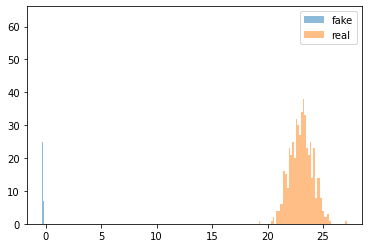

cum_dis_loss -3786.93916015625, cum_gen_loss 2.7469379901885986
4


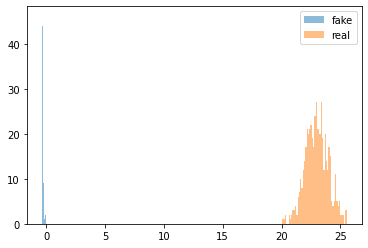

cum_dis_loss -3548.425634765625, cum_gen_loss 2.7711464166641235
6


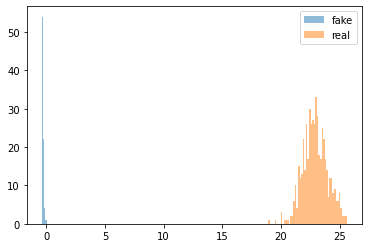

cum_dis_loss -3268.532666015625, cum_gen_loss 2.8033318519592285
8


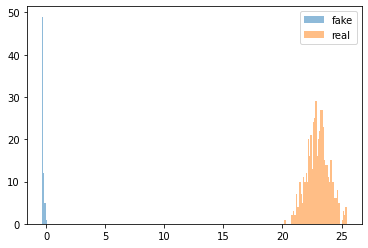

cum_dis_loss -2922.32001953125, cum_gen_loss 2.838416814804077
10


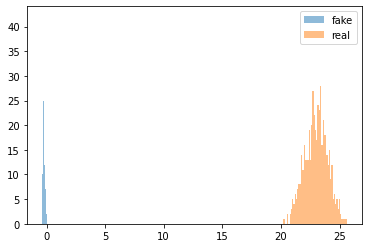

cum_dis_loss -2500.4787353515626, cum_gen_loss 2.869650959968567
12


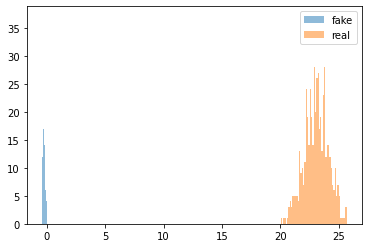

cum_dis_loss -1988.8841552734375, cum_gen_loss 2.895569324493408
14


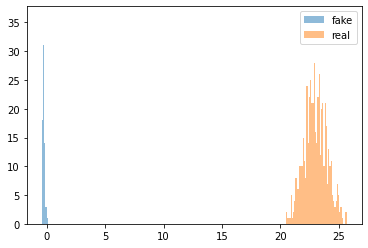

cum_dis_loss -1428.4797119140626, cum_gen_loss 2.9158620834350586
16


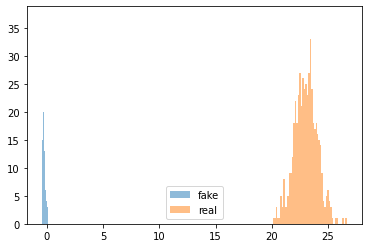

cum_dis_loss -871.8258483886718, cum_gen_loss 2.933431029319763
18


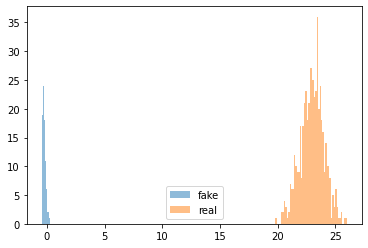

cum_dis_loss -404.2936737060547, cum_gen_loss 2.951114296913147
20


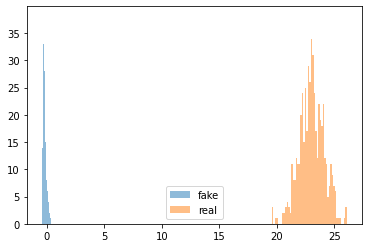

cum_dis_loss -113.37859153747559, cum_gen_loss 2.9506988525390625
22


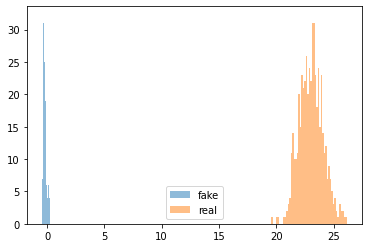

cum_dis_loss -8.284528362751008, cum_gen_loss 2.9547215700149536
24


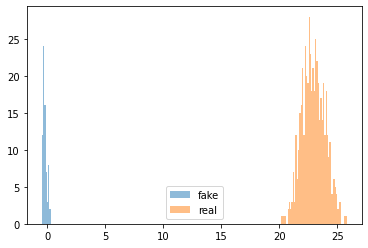

cum_dis_loss -1.1697300672531128, cum_gen_loss 2.958082437515259
26


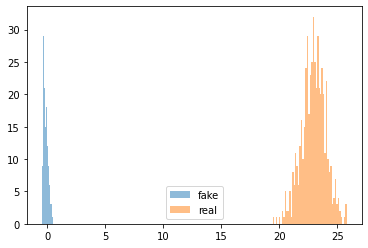

cum_dis_loss -3.115046834945679, cum_gen_loss 2.953998565673828
28


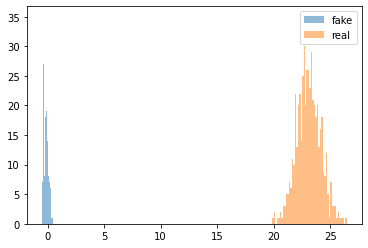

cum_dis_loss 0.40014004707336426, cum_gen_loss 2.9470475912094116
30


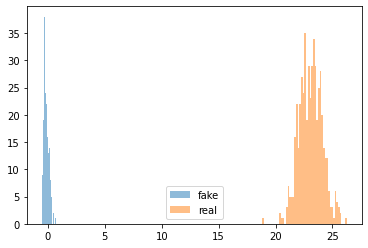

cum_dis_loss 1.9574543833732605, cum_gen_loss 2.9392229318618774
32


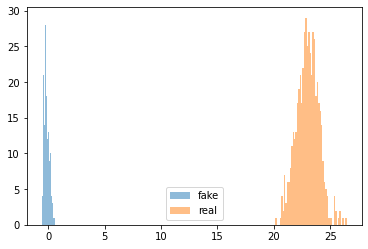

cum_dis_loss 1.9101837396621704, cum_gen_loss 2.9408299922943115
34


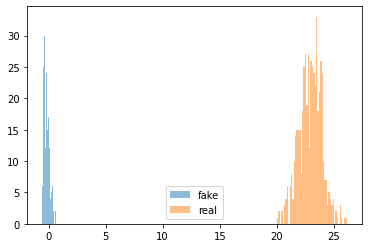

cum_dis_loss 1.919491958618164, cum_gen_loss 2.9361281394958496
36


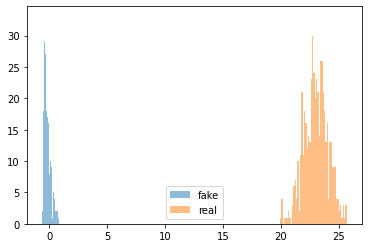

cum_dis_loss 1.9586029052734375, cum_gen_loss 2.9313994646072388
38


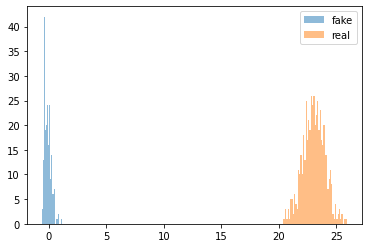

cum_dis_loss 1.9357273578643799, cum_gen_loss 2.930314064025879
40


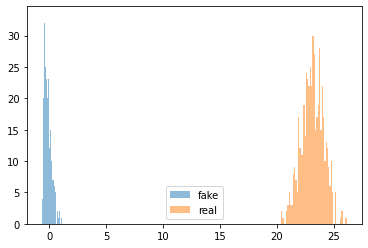

cum_dis_loss 1.9456233263015748, cum_gen_loss 2.9226818084716797
42


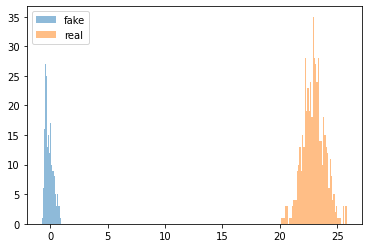

cum_dis_loss 1.9525725364685058, cum_gen_loss 2.917139410972595
44


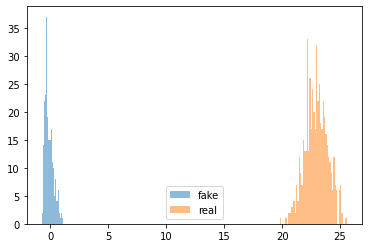

cum_dis_loss 1.9034921765327453, cum_gen_loss 2.9171923398971558
46


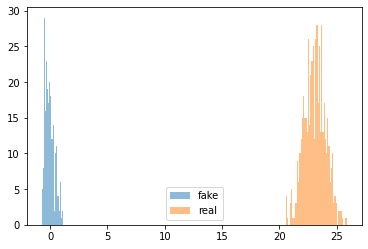

cum_dis_loss 1.9093125104904174, cum_gen_loss 2.9181621074676514
48


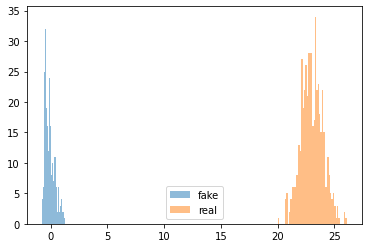

cum_dis_loss 1.9044007182121276, cum_gen_loss 2.9144434928894043
50


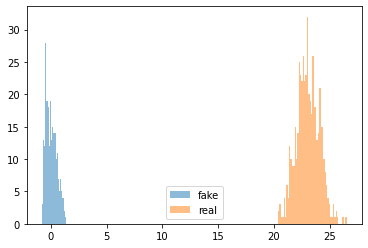

cum_dis_loss 1.8733415961265565, cum_gen_loss 2.908215284347534
52


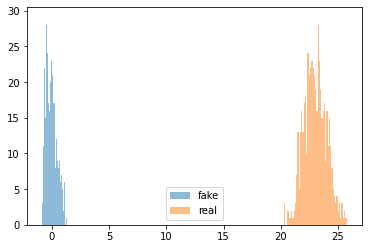

cum_dis_loss 1.8535432457923888, cum_gen_loss 2.9034234285354614
54


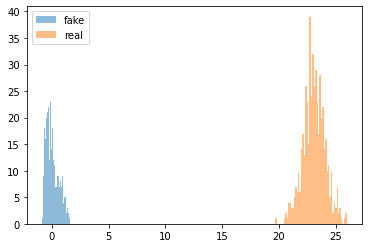

cum_dis_loss 1.8465166449546815, cum_gen_loss 2.9016891717910767
56


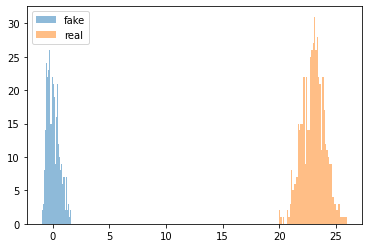

cum_dis_loss 1.9269220948219299, cum_gen_loss 2.891651153564453
58


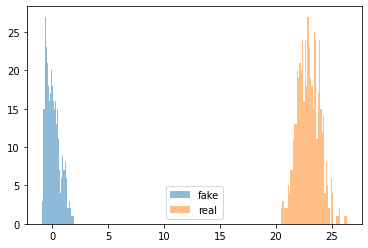

cum_dis_loss 1.9175223231315612, cum_gen_loss 2.881777286529541
60


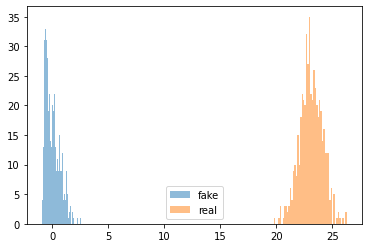

cum_dis_loss 1.8831437706947327, cum_gen_loss 2.8825639486312866
62


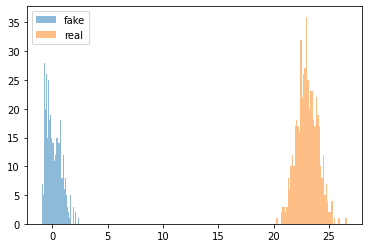

cum_dis_loss 1.870838224887848, cum_gen_loss 2.8685542345046997
64


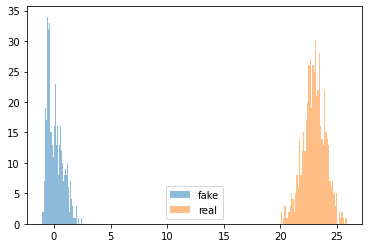

cum_dis_loss 1.888851797580719, cum_gen_loss 2.8710912466049194
66


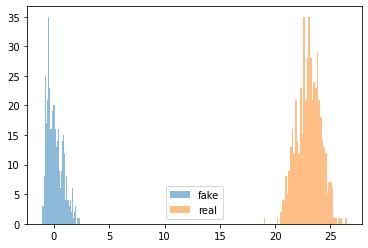

cum_dis_loss 1.8575562119483948, cum_gen_loss 2.860909104347229
68


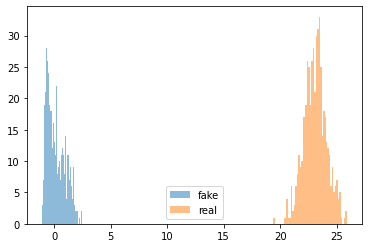

cum_dis_loss 1.8439191102981567, cum_gen_loss 2.8651422262191772
70


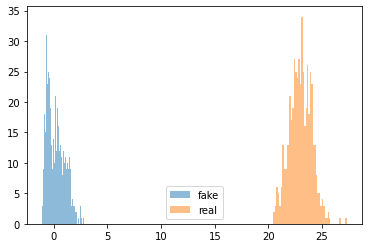

cum_dis_loss 1.7969372510910033, cum_gen_loss 2.844468355178833
72


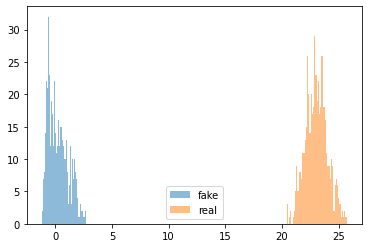

cum_dis_loss 1.766183567047119, cum_gen_loss 2.8541598320007324
74


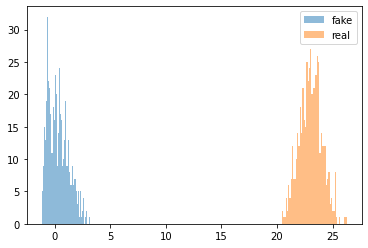

cum_dis_loss 1.7688058018684387, cum_gen_loss 2.8316234350204468
76


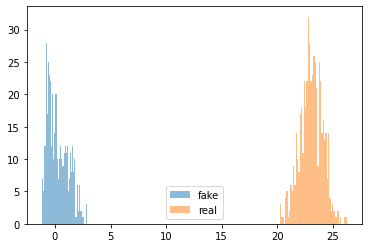

cum_dis_loss 1.7331761479377747, cum_gen_loss 2.8311630487442017
78


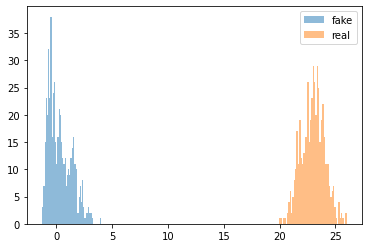

cum_dis_loss 1.7104769229888916, cum_gen_loss 2.8251034021377563
80


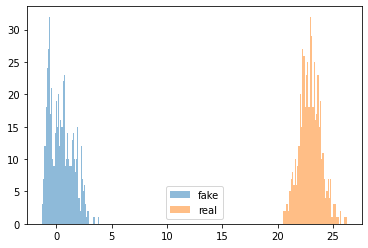

cum_dis_loss 1.6710177063941956, cum_gen_loss 2.809757709503174
82


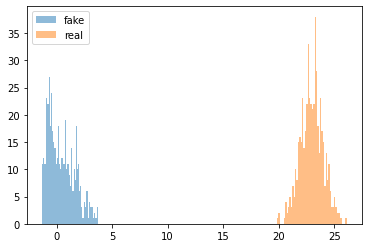

cum_dis_loss 1.6439826011657714, cum_gen_loss 2.810274362564087
84


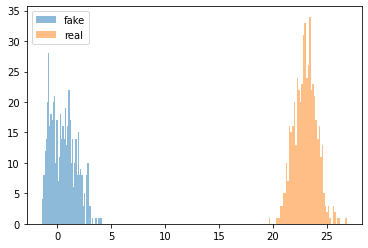

cum_dis_loss 1.5626524448394776, cum_gen_loss 2.7982094287872314
86


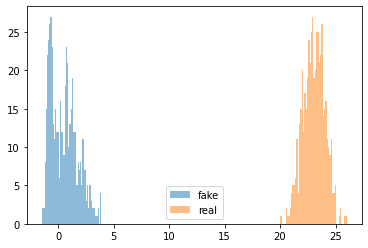

cum_dis_loss 1.5857256650924683, cum_gen_loss 2.8005900382995605
88


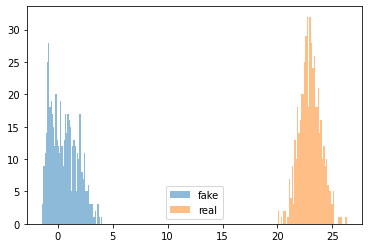

cum_dis_loss 1.5618742942810058, cum_gen_loss 2.7896114587783813
90


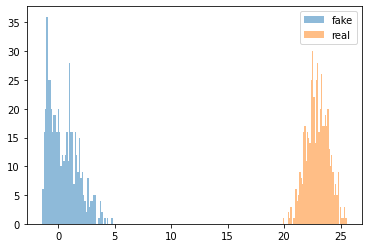

cum_dis_loss 1.4864573359489441, cum_gen_loss 2.7767544984817505
92


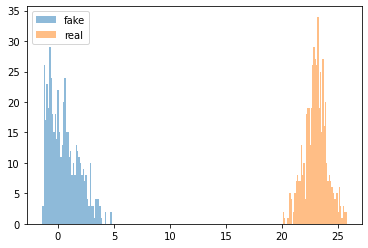

cum_dis_loss 1.4542985439300538, cum_gen_loss 2.768684506416321
94


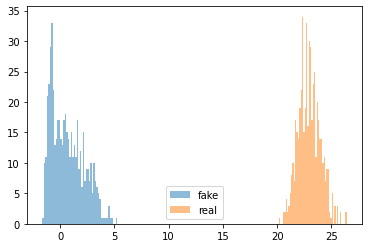

cum_dis_loss 1.4200615406036377, cum_gen_loss 2.7659859657287598
96


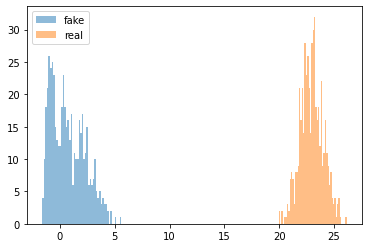

cum_dis_loss 1.3753694653511048, cum_gen_loss 2.753217101097107
98


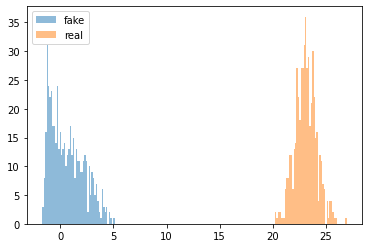

cum_dis_loss 1.2903843164443969, cum_gen_loss 2.74611234664917
100


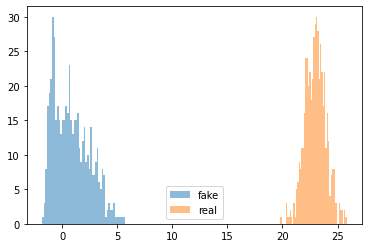

cum_dis_loss 1.3050968408584596, cum_gen_loss 2.73747980594635
102


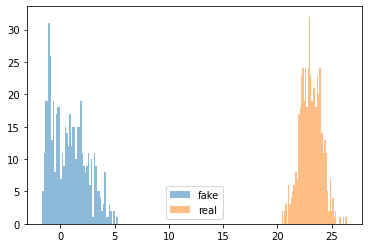

cum_dis_loss 1.2453511834144593, cum_gen_loss 2.7217427492141724
104


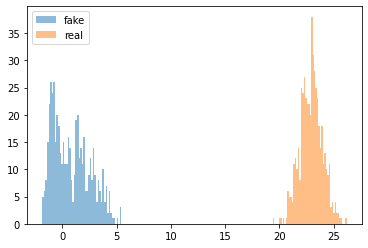

cum_dis_loss 1.1878379344940186, cum_gen_loss 2.7231545448303223
106


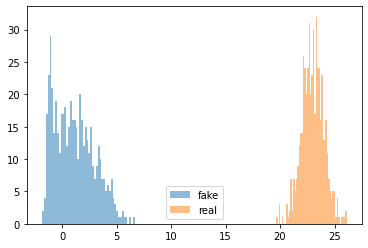

cum_dis_loss 1.130455207824707, cum_gen_loss 2.7096505165100098
108


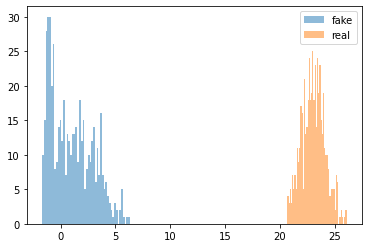

cum_dis_loss 1.0430098533630372, cum_gen_loss 2.705139636993408
110


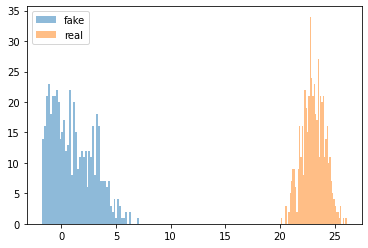

cum_dis_loss 0.9915510535240173, cum_gen_loss 2.6994794607162476
112


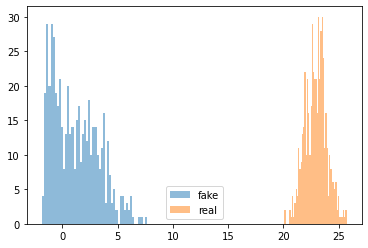

cum_dis_loss 0.9482034802436828, cum_gen_loss 2.6865041255950928
114


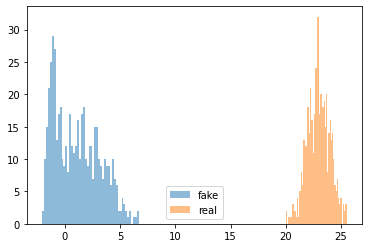

cum_dis_loss 0.931978952884674, cum_gen_loss 2.6852387189865112
116


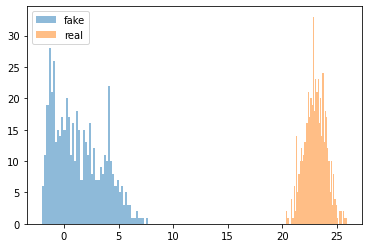

cum_dis_loss 0.8672819852828979, cum_gen_loss 2.665456533432007
118


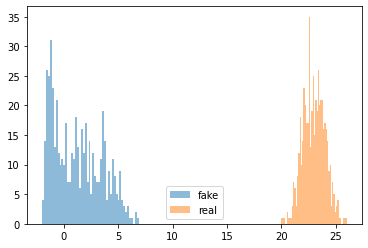

cum_dis_loss 0.8159040331840515, cum_gen_loss 2.648278594017029
120


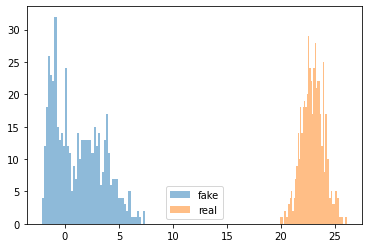

cum_dis_loss 0.8058194994926453, cum_gen_loss 2.647440195083618
122


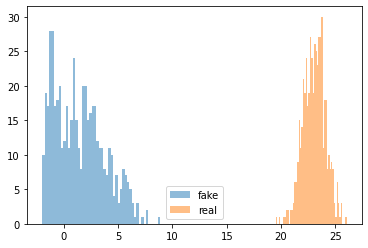

cum_dis_loss 0.6906288743019104, cum_gen_loss 2.6379772424697876
124


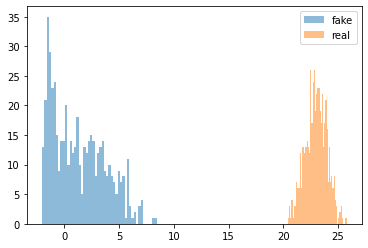

cum_dis_loss 0.7236708045005799, cum_gen_loss 2.6164028644561768
126


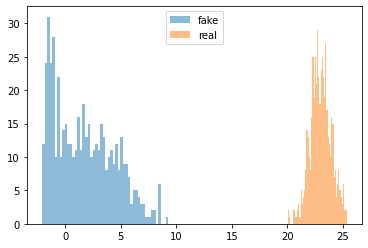

cum_dis_loss 0.7138141632080078, cum_gen_loss 2.6112877130508423
128


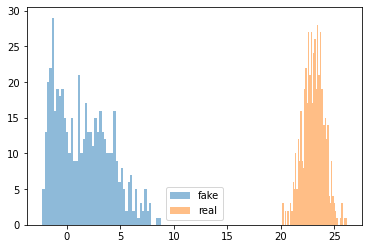

cum_dis_loss 0.6830074906349182, cum_gen_loss 2.5983972549438477
130


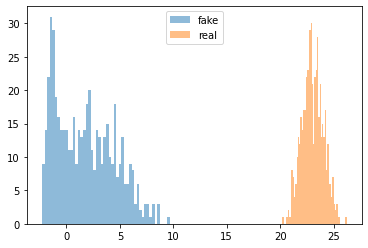

cum_dis_loss 0.6887984991073608, cum_gen_loss 2.591679334640503
132


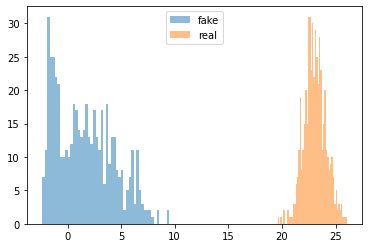

cum_dis_loss 0.6567432522773743, cum_gen_loss 2.579403519630432
134


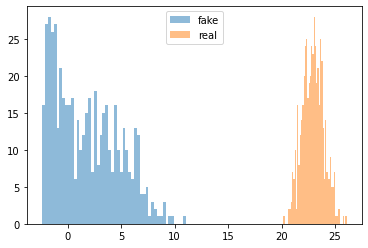

cum_dis_loss 0.6898207664489746, cum_gen_loss 2.567815661430359
136


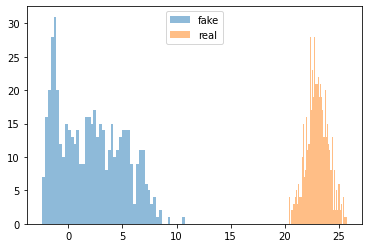

cum_dis_loss 0.7208236336708069, cum_gen_loss 2.5431867837905884
138


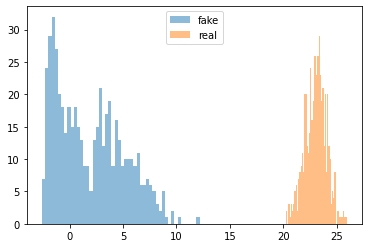

cum_dis_loss 0.7785350561141968, cum_gen_loss 2.5428311824798584
140


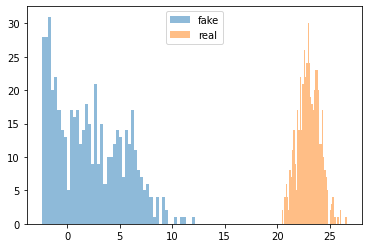

cum_dis_loss 0.7614300608634949, cum_gen_loss 2.537587881088257
142


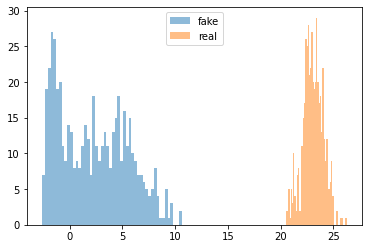

cum_dis_loss 0.8520983934402466, cum_gen_loss 2.526538848876953
144


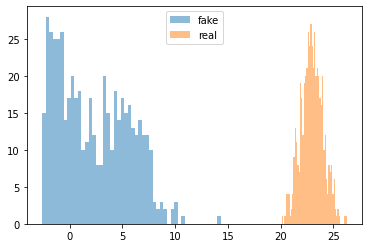

cum_dis_loss 0.8937840461730957, cum_gen_loss 2.511225461959839
146


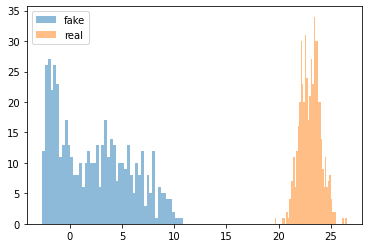

cum_dis_loss 0.9636513948440552, cum_gen_loss 2.4905701875686646
148


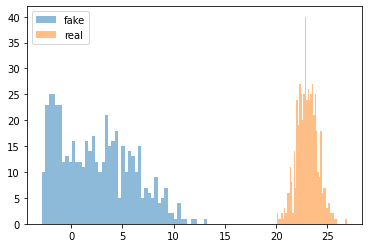

cum_dis_loss 1.1163587808609008, cum_gen_loss 2.48646080493927
150


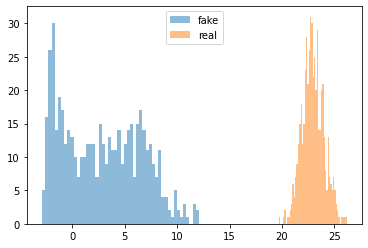

cum_dis_loss 1.1626086831092834, cum_gen_loss 2.477229952812195
152


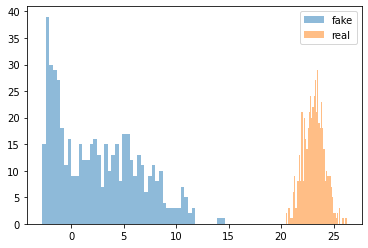

cum_dis_loss 1.2670496225357055, cum_gen_loss 2.4633567333221436
154


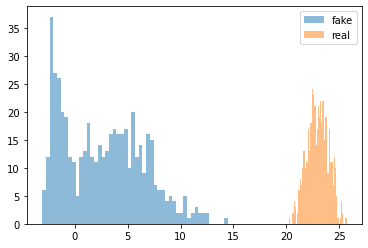

cum_dis_loss 1.3712016224861145, cum_gen_loss 2.4424699544906616
156


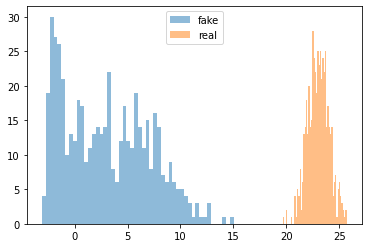

cum_dis_loss 1.4255191445350648, cum_gen_loss 2.4208614826202393
158


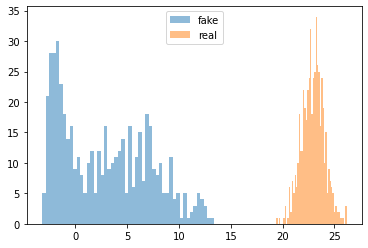

cum_dis_loss 1.5373187422752381, cum_gen_loss 2.4197956323623657
160


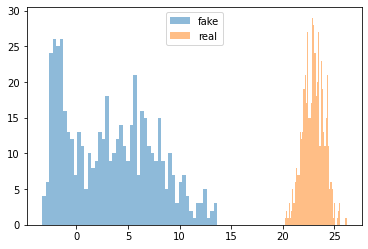

cum_dis_loss 1.605443298816681, cum_gen_loss 2.411393404006958
162


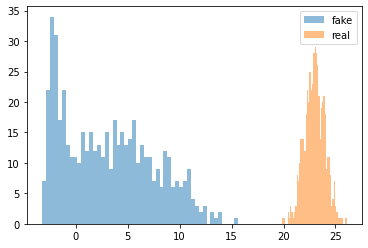

cum_dis_loss 1.6795323610305786, cum_gen_loss 2.3951627016067505
164


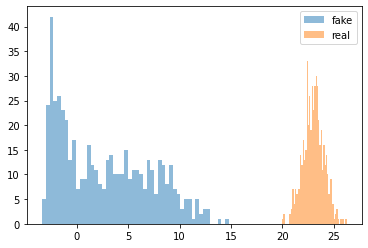

cum_dis_loss 1.7331794619560241, cum_gen_loss 2.383479356765747
166


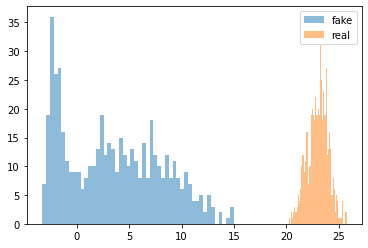

cum_dis_loss 1.7832389712333678, cum_gen_loss 2.3755300045013428
168


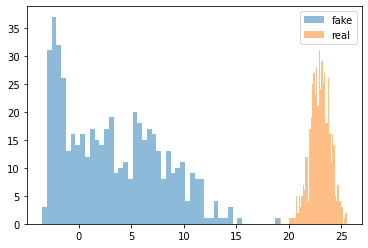

cum_dis_loss 1.8520694613456725, cum_gen_loss 2.36611807346344
170


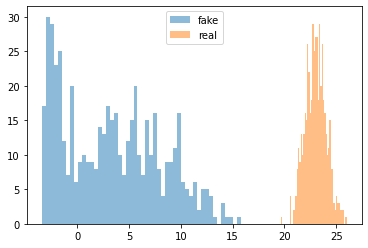

cum_dis_loss 1.877862000465393, cum_gen_loss 2.3505918979644775
172


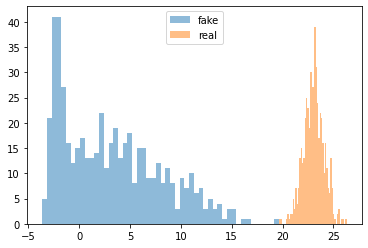

cum_dis_loss 1.9166003227233888, cum_gen_loss 2.356195330619812
174


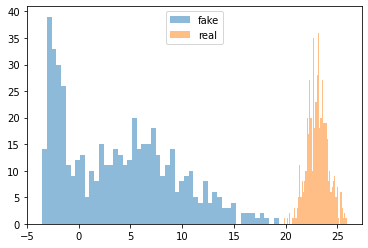

cum_dis_loss 1.9405224442481994, cum_gen_loss 2.3266332149505615
176


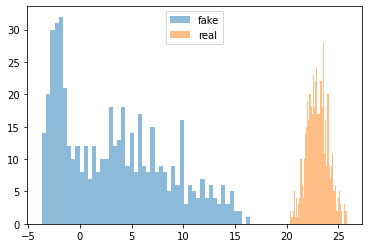

cum_dis_loss 1.9556653380393982, cum_gen_loss 2.3023749589920044
178


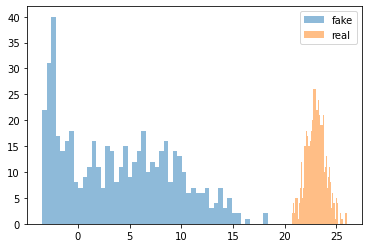

cum_dis_loss 1.9837901830673217, cum_gen_loss 2.3052393198013306
180


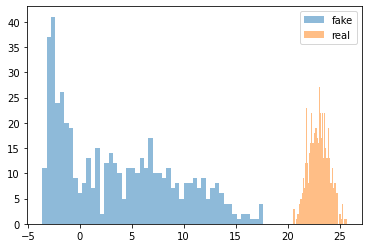

cum_dis_loss 1.9971918940544129, cum_gen_loss 2.3043618202209473
182


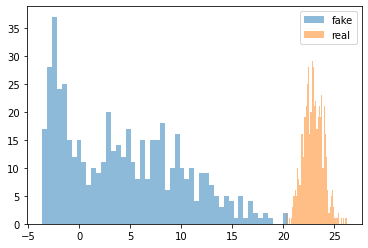

cum_dis_loss 2.009299468994141, cum_gen_loss 2.289791464805603
184


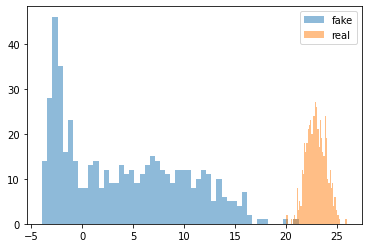

cum_dis_loss 2.0219905614852904, cum_gen_loss 2.2543805837631226
186


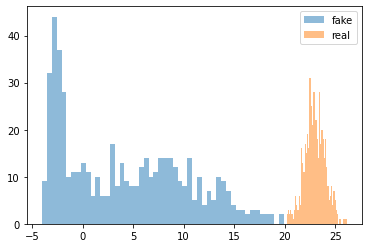

cum_dis_loss 2.0238229632377625, cum_gen_loss 2.255945086479187
188


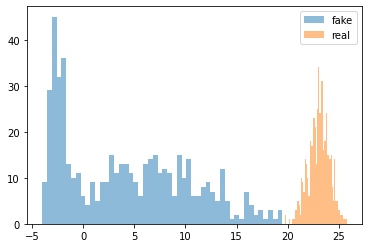

cum_dis_loss 2.0281744480133055, cum_gen_loss 2.2477564811706543
190


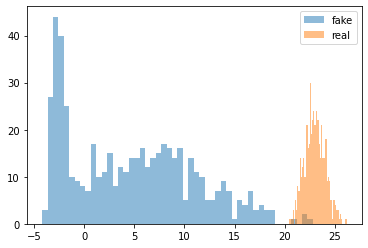

cum_dis_loss 2.0225175499916075, cum_gen_loss 2.2369165420532227
192


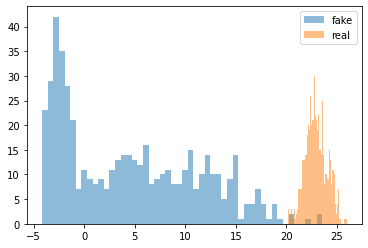

cum_dis_loss 2.0296832799911497, cum_gen_loss 2.204453229904175
194


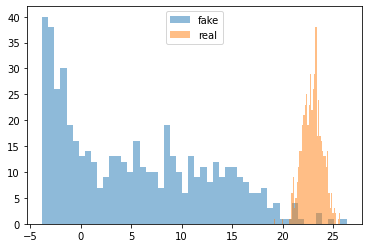

cum_dis_loss 2.0185414791107177, cum_gen_loss 2.218746542930603
196


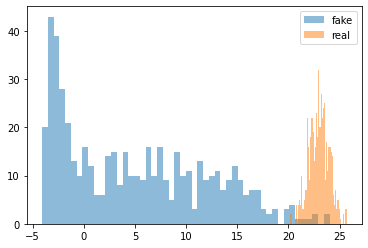

cum_dis_loss 2.00677752494812, cum_gen_loss 2.1659352779388428
198


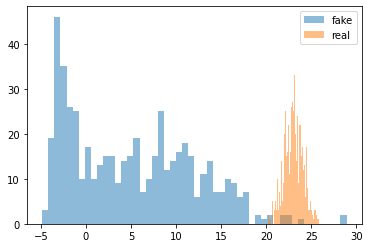

cum_dis_loss 1.9914736866950988, cum_gen_loss 2.1444079875946045
200


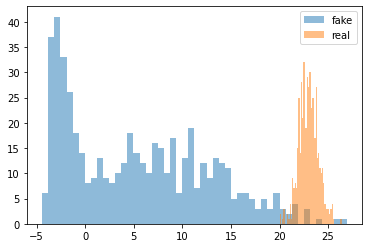

cum_dis_loss 1.9925544142723084, cum_gen_loss 2.115333318710327
202


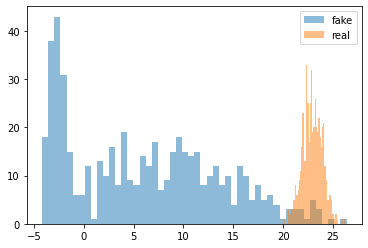

cum_dis_loss 1.9654606580734253, cum_gen_loss 2.100011706352234
204


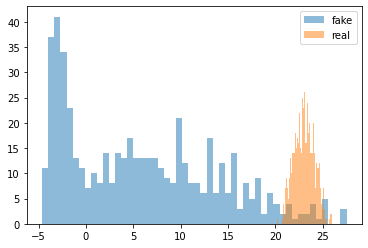

cum_dis_loss 1.9413017988204957, cum_gen_loss 2.081987142562866
206


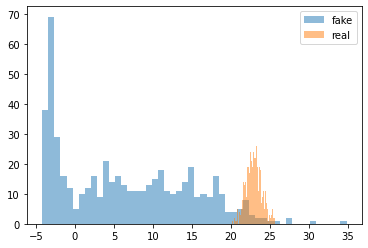

cum_dis_loss 1.9142941117286683, cum_gen_loss 2.0263290405273438
208


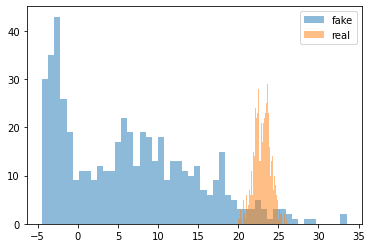

cum_dis_loss 1.8825202941894532, cum_gen_loss 2.0039114952087402
210


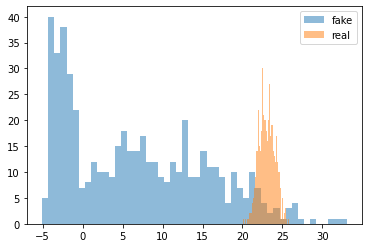

cum_dis_loss 1.869227409362793, cum_gen_loss 2.0349878072738647
212


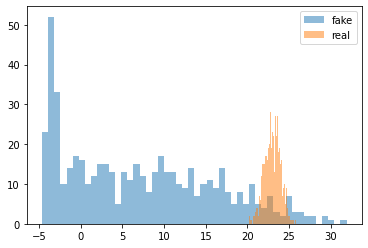

cum_dis_loss 1.8257233262062074, cum_gen_loss 1.971986472606659
214


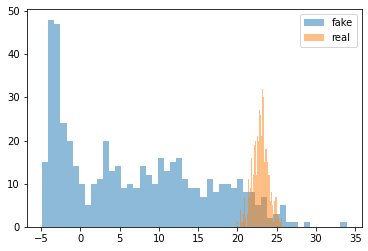

cum_dis_loss 1.8002109408378602, cum_gen_loss 1.9572267532348633
216


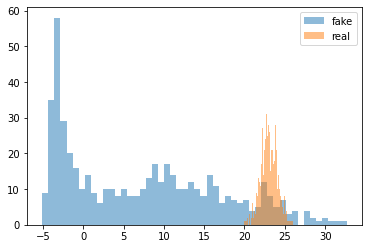

cum_dis_loss 1.7565161824226379, cum_gen_loss 1.9357798099517822
218


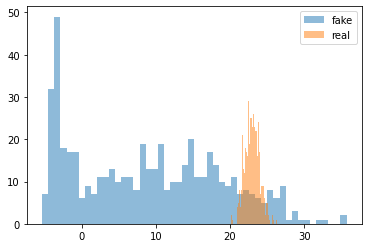

cum_dis_loss 1.7164289832115174, cum_gen_loss 1.8849655389785767
220


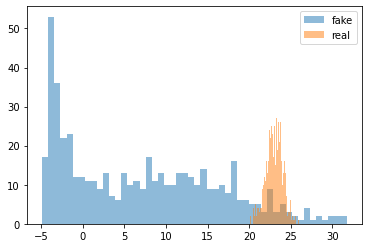

cum_dis_loss 1.6873496890068054, cum_gen_loss 1.8635541200637817
222


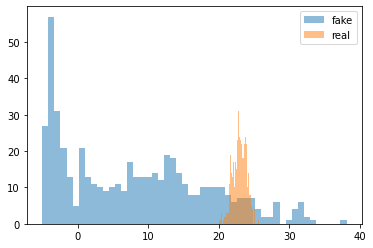

cum_dis_loss 1.667616105079651, cum_gen_loss 1.8851425647735596
224


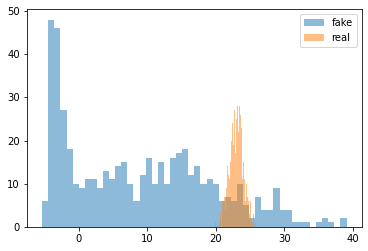

cum_dis_loss 1.6263021111488343, cum_gen_loss 1.8389329314231873
226


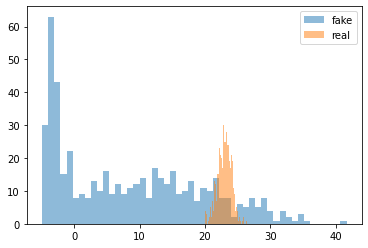

cum_dis_loss 1.5755686521530152, cum_gen_loss 1.800434648990631
228


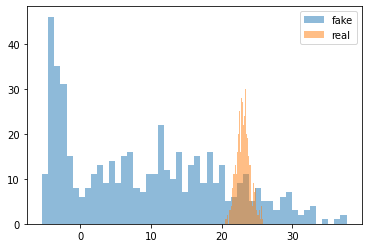

cum_dis_loss 1.5491744041442872, cum_gen_loss 1.778549313545227
230


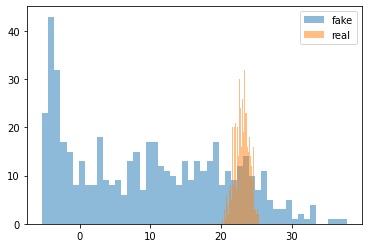

cum_dis_loss 1.5294208168983459, cum_gen_loss 1.7682082653045654
232


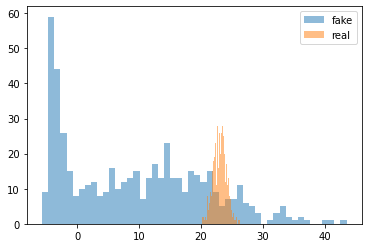

cum_dis_loss 1.5319102883338929, cum_gen_loss 1.82412850856781
234


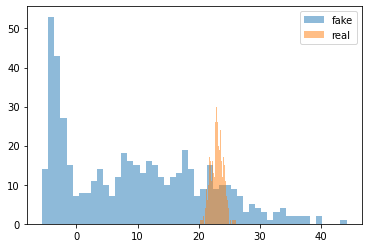

cum_dis_loss 1.47665673494339, cum_gen_loss 1.7676392197608948
236


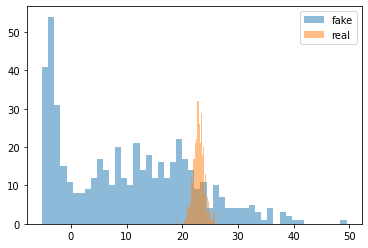

cum_dis_loss 1.5155110478401184, cum_gen_loss 1.7876819372177124
238


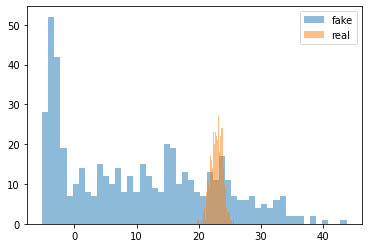

cum_dis_loss 1.4935778975486755, cum_gen_loss 1.7465984225273132
240


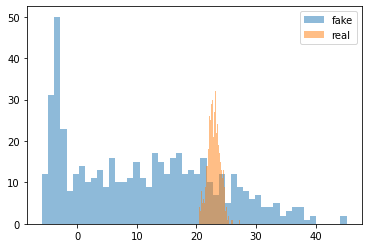

cum_dis_loss 1.4837688088417054, cum_gen_loss 1.7189188599586487
242


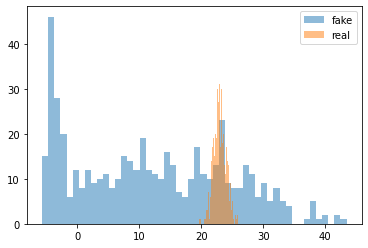

cum_dis_loss 1.4972213506698608, cum_gen_loss 1.75076824426651
244


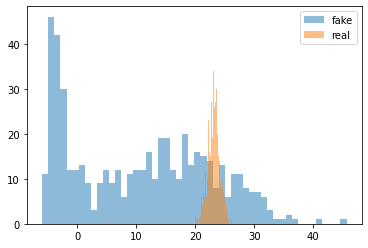

cum_dis_loss 1.408619475364685, cum_gen_loss 1.7414149641990662
246


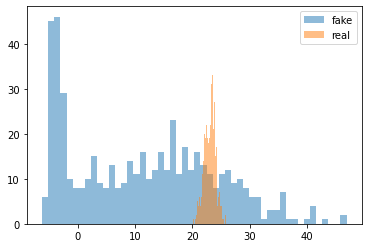

cum_dis_loss 1.439061737060547, cum_gen_loss 1.7073468565940857
248


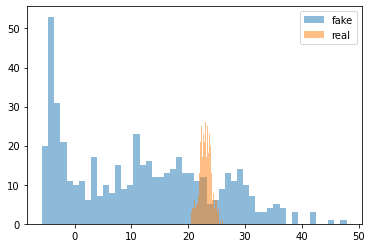

cum_dis_loss 1.497818410396576, cum_gen_loss 1.6806880235671997
250


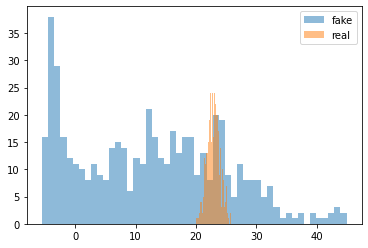

cum_dis_loss 1.4781209468841552, cum_gen_loss 1.6934398412704468
252


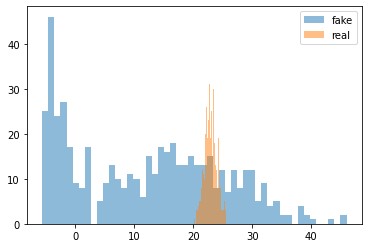

cum_dis_loss 1.4930370330810547, cum_gen_loss 1.6669436693191528
254


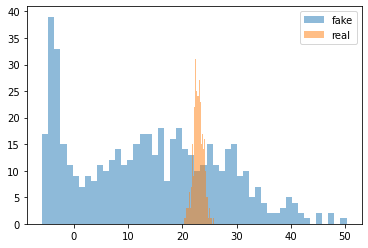

cum_dis_loss 1.5119805455207824, cum_gen_loss 1.6683458089828491
256


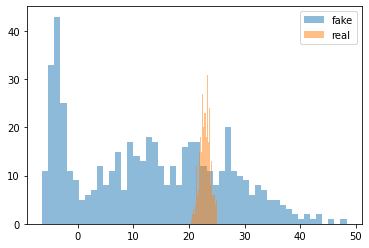

cum_dis_loss 1.506959581375122, cum_gen_loss 1.6576371788978577
258


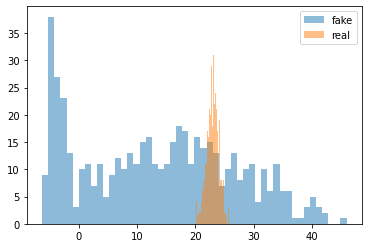

cum_dis_loss 1.5057134628295898, cum_gen_loss 1.6593568921089172
260


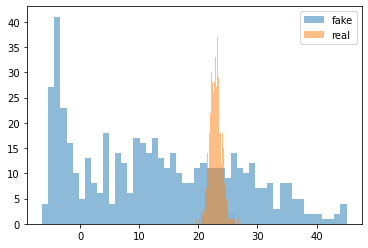

cum_dis_loss 1.5261616110801697, cum_gen_loss 1.6667481064796448
262


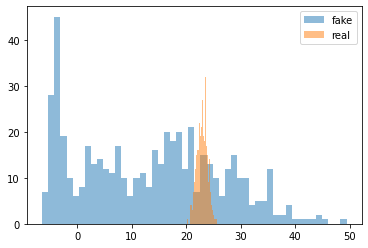

cum_dis_loss 1.533078944683075, cum_gen_loss 1.6250932812690735
264


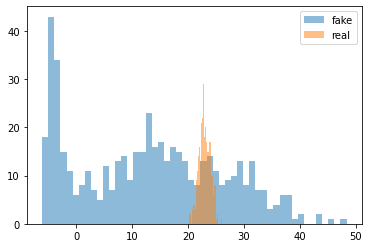

cum_dis_loss 1.5398730874061584, cum_gen_loss 1.667382836341858
266


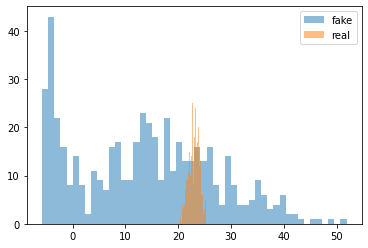

cum_dis_loss 1.528243088722229, cum_gen_loss 1.6618869304656982
268


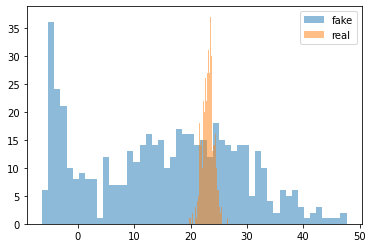

cum_dis_loss 1.541360354423523, cum_gen_loss 1.6333392262458801
270


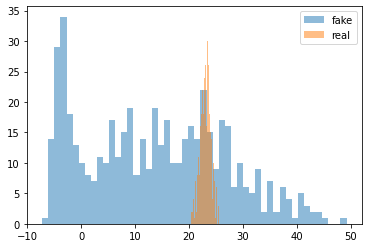

cum_dis_loss 1.518317985534668, cum_gen_loss 1.6314369440078735
272


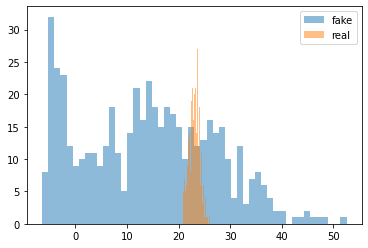

cum_dis_loss 1.5562960505485535, cum_gen_loss 1.605233371257782
274


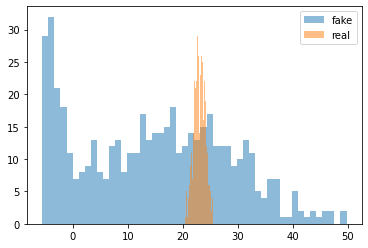

cum_dis_loss 1.5326458930969238, cum_gen_loss 1.6549975275993347
276


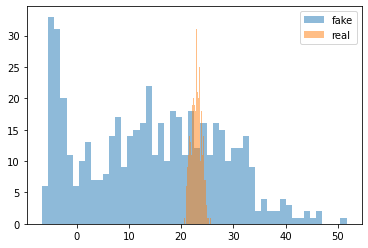

cum_dis_loss 1.5425176978111268, cum_gen_loss 1.6101904511451721
278


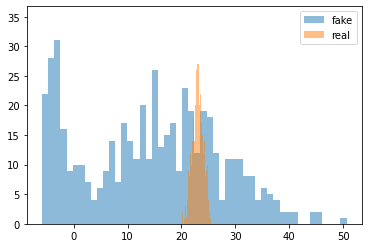

cum_dis_loss 1.5245492696762084, cum_gen_loss 1.6190519332885742
280


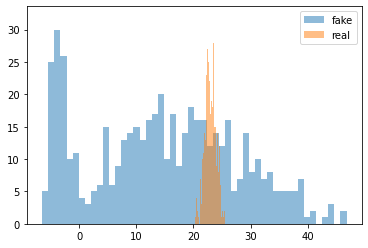

cum_dis_loss 1.5349588751792909, cum_gen_loss 1.6237346529960632
282


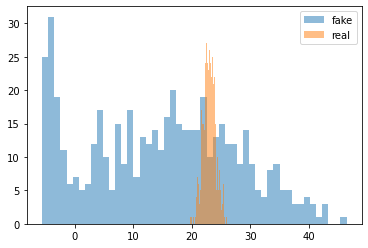

cum_dis_loss 1.5282532811164855, cum_gen_loss 1.6227858662605286
284


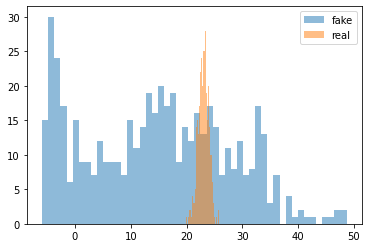

cum_dis_loss 1.5126656532287597, cum_gen_loss 1.61969792842865
286


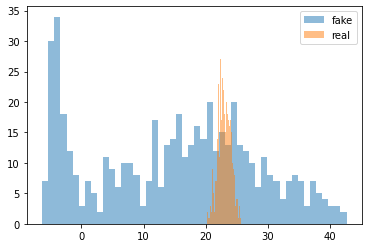

cum_dis_loss 1.5144928455352784, cum_gen_loss 1.5908763408660889
288


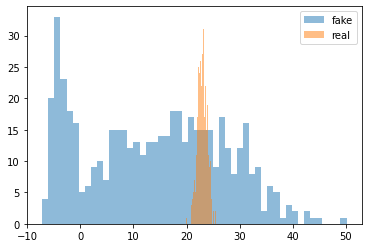

cum_dis_loss 1.5235235214233398, cum_gen_loss 1.547184705734253
290


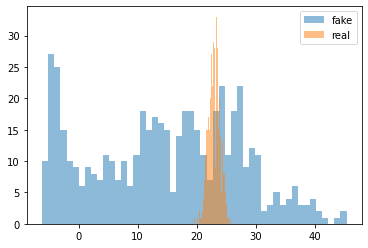

cum_dis_loss 1.5115537881851195, cum_gen_loss 1.5490759015083313
292


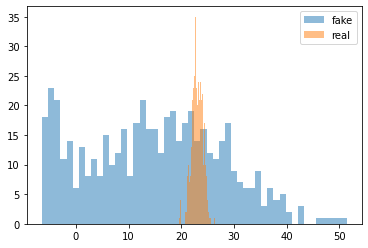

cum_dis_loss 1.5378845453262329, cum_gen_loss 1.5647966265678406
294


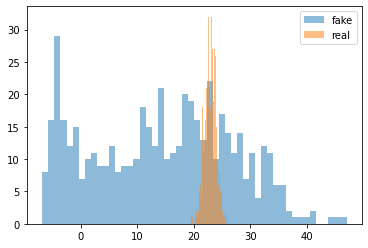

cum_dis_loss 1.5197523593902589, cum_gen_loss 1.5602675676345825
296


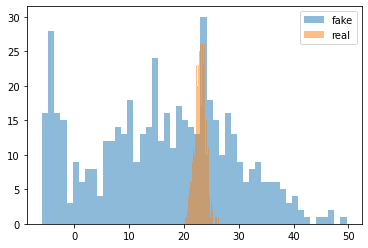

cum_dis_loss 1.4929166078567504, cum_gen_loss 1.5572439432144165
298


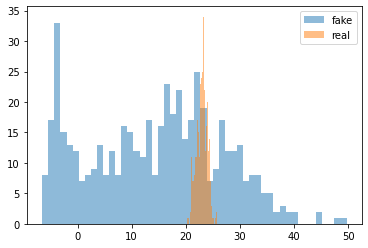

cum_dis_loss 1.4954132437705994, cum_gen_loss 1.5543959140777588
300


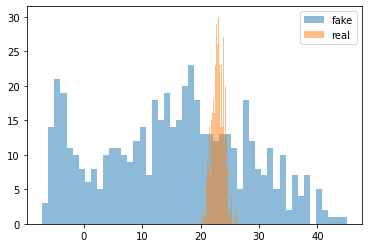

cum_dis_loss 1.5036129117012025, cum_gen_loss 1.5032098889350891
302


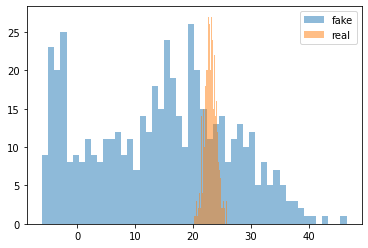

cum_dis_loss 1.5111381530761718, cum_gen_loss 1.5651748180389404
304


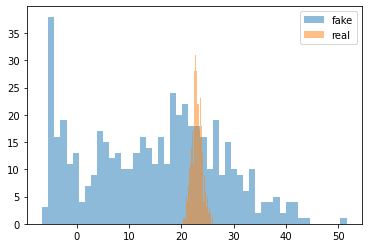

cum_dis_loss 1.5006914854049682, cum_gen_loss 1.5298271179199219
306


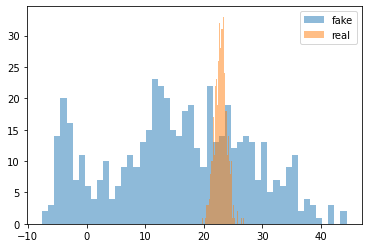

cum_dis_loss 1.484390676021576, cum_gen_loss 1.51682847738266
308


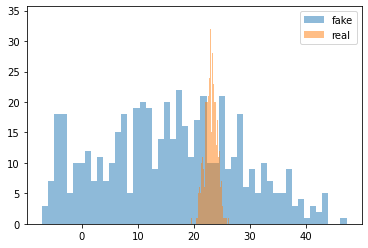

cum_dis_loss 1.4789632320404054, cum_gen_loss 1.5652180314064026
310


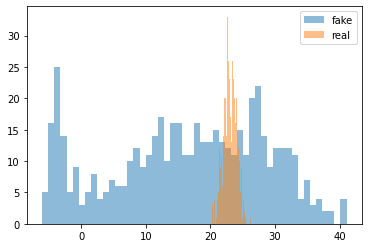

cum_dis_loss 1.4788157224655152, cum_gen_loss 1.560742437839508
312


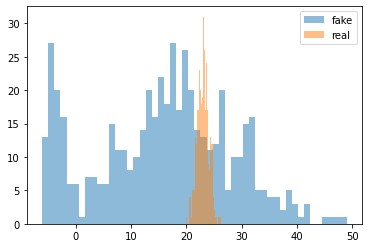

cum_dis_loss 1.4903759717941285, cum_gen_loss 1.4929340481758118
314


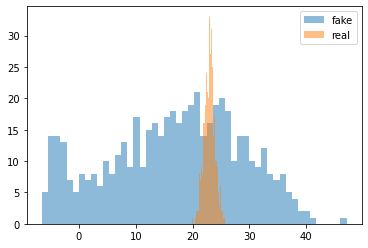

cum_dis_loss 1.454111349582672, cum_gen_loss 1.4747682809829712
316


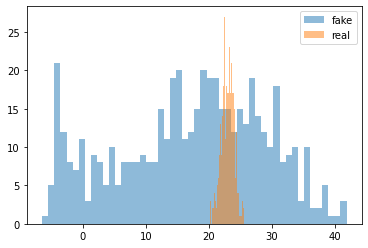

cum_dis_loss 1.4581007957458496, cum_gen_loss 1.5026739835739136
318


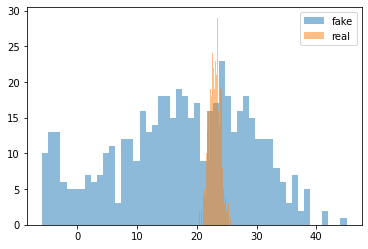

cum_dis_loss 1.451935625076294, cum_gen_loss 1.5098329186439514
320


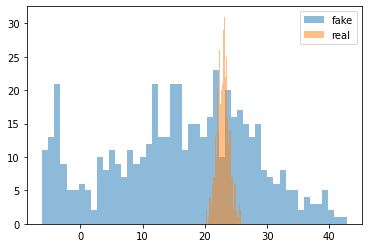

cum_dis_loss 1.445372426509857, cum_gen_loss 1.4685081243515015
322


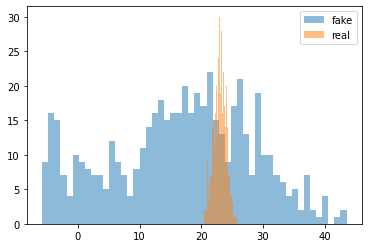

cum_dis_loss 1.432728350162506, cum_gen_loss 1.5015330910682678
324


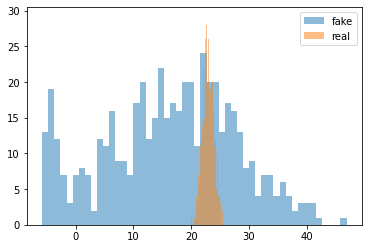

cum_dis_loss 1.4515003561973572, cum_gen_loss 1.4809008240699768
326


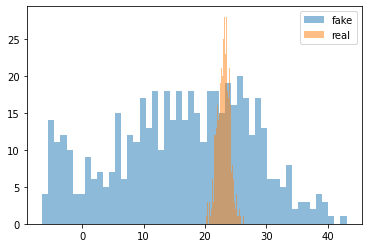

cum_dis_loss 1.4283323287963867, cum_gen_loss 1.4783037304878235
328


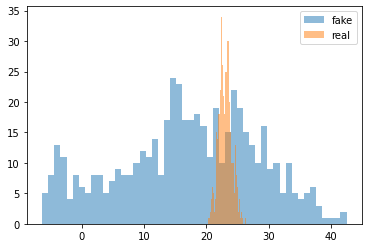

cum_dis_loss 1.4179490804672241, cum_gen_loss 1.4042590260505676
330


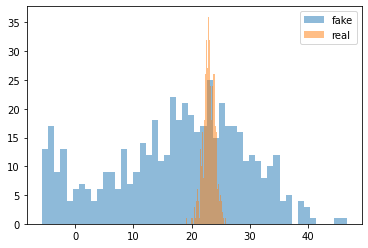

cum_dis_loss 1.4262831568717957, cum_gen_loss 1.4396331310272217
332


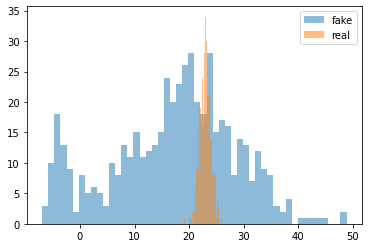

cum_dis_loss 1.419986605644226, cum_gen_loss 1.43787682056427
334


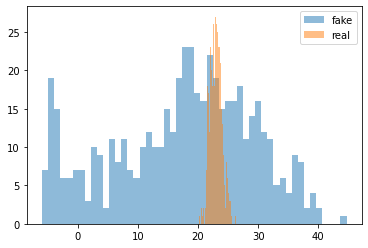

cum_dis_loss 1.4081037640571594, cum_gen_loss 1.4673763513565063
336


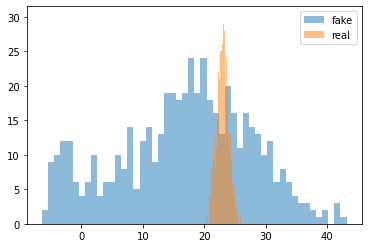

cum_dis_loss 1.3972360968589783, cum_gen_loss 1.442611813545227
338


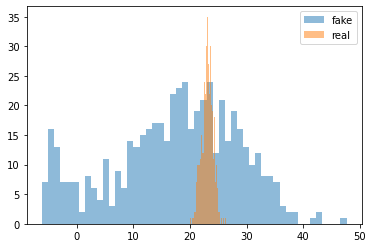

cum_dis_loss 1.4037490844726563, cum_gen_loss 1.36568284034729
340


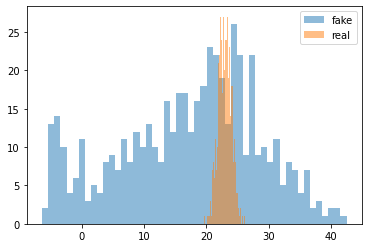

cum_dis_loss 1.3801091313362122, cum_gen_loss 1.4114986658096313
342


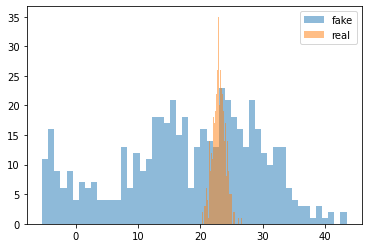

cum_dis_loss 1.3695475697517394, cum_gen_loss 1.3723651766777039
344


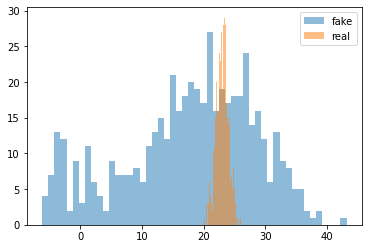

cum_dis_loss 1.3842591285705566, cum_gen_loss 1.3938271403312683
346


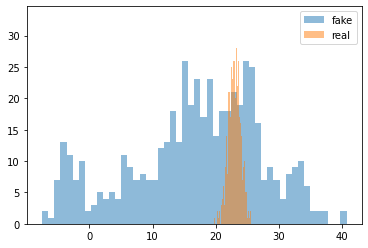

cum_dis_loss 1.3839031219482423, cum_gen_loss 1.349901020526886
348


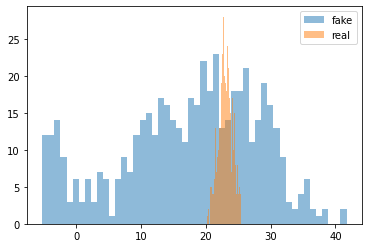

cum_dis_loss 1.3623291015625, cum_gen_loss 1.3558350801467896
350


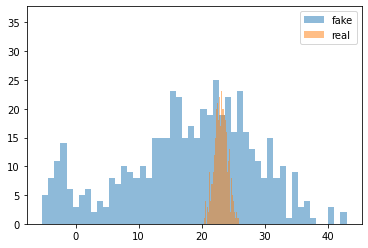

cum_dis_loss 1.3471308708190919, cum_gen_loss 1.357820451259613
352


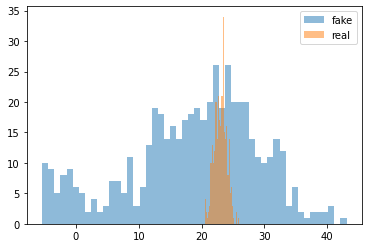

cum_dis_loss 1.3452885746955872, cum_gen_loss 1.352435052394867
354


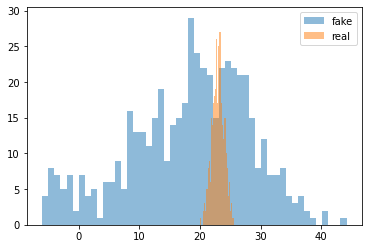

cum_dis_loss 1.3321008920669555, cum_gen_loss 1.3567452430725098
356


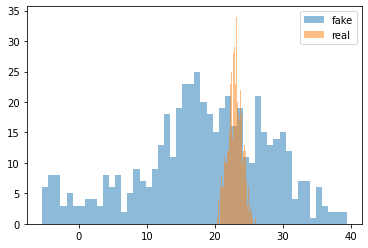

cum_dis_loss 1.343067455291748, cum_gen_loss 1.298750400543213
358


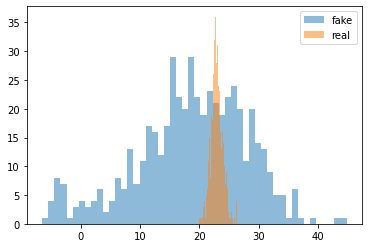

cum_dis_loss 1.3089030385017395, cum_gen_loss 1.3582559823989868
360


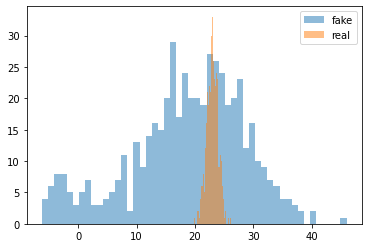

cum_dis_loss 1.316508424282074, cum_gen_loss 1.3286845088005066
362


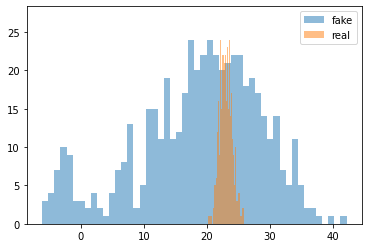

cum_dis_loss 1.3029954195022584, cum_gen_loss 1.277862012386322
364


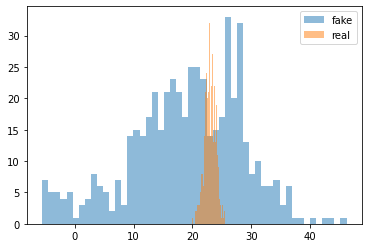

cum_dis_loss 1.3221065163612367, cum_gen_loss 1.3465219140052795
366


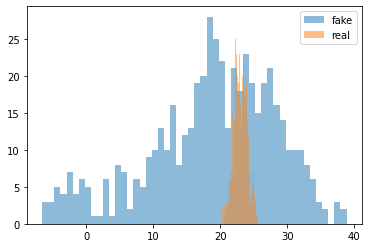

cum_dis_loss 1.2977558612823485, cum_gen_loss 1.3097657561302185
368


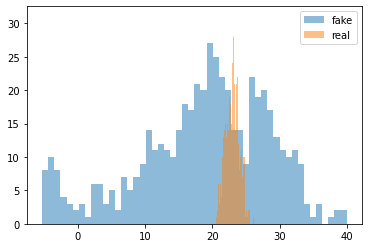

cum_dis_loss 1.2752498984336853, cum_gen_loss 1.2979636192321777
370


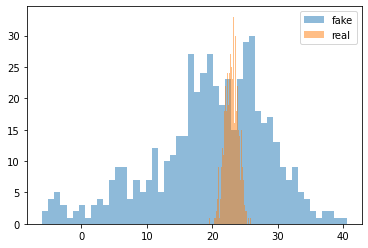

cum_dis_loss 1.2816920042037965, cum_gen_loss 1.3163286447525024
372


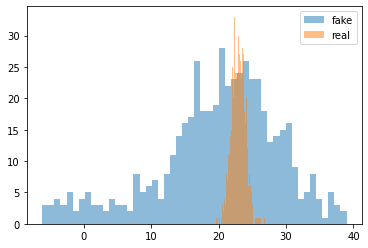

cum_dis_loss 1.2606829404830933, cum_gen_loss 1.2529088258743286
374


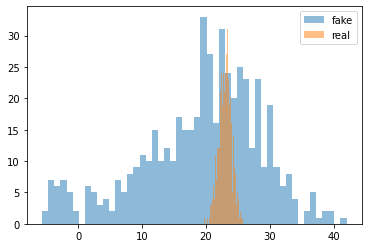

cum_dis_loss 1.2552470803260802, cum_gen_loss 1.2444148659706116
376


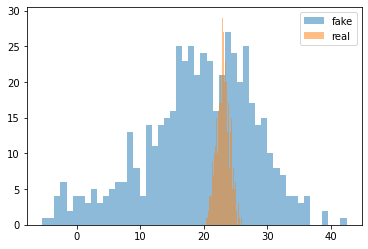

cum_dis_loss 1.2522901058197022, cum_gen_loss 1.2208402156829834
378


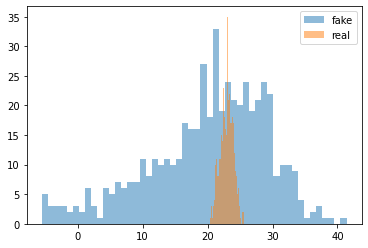

cum_dis_loss 1.2511855006217956, cum_gen_loss 1.2168595790863037
380


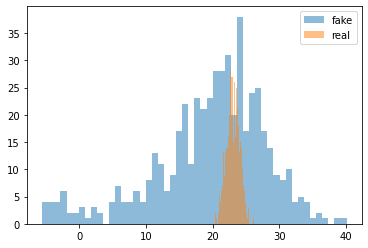

cum_dis_loss 1.2154401540756226, cum_gen_loss 1.253786563873291
382


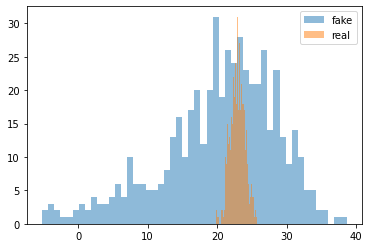

cum_dis_loss 1.1878817677497864, cum_gen_loss 1.2016802430152893
384


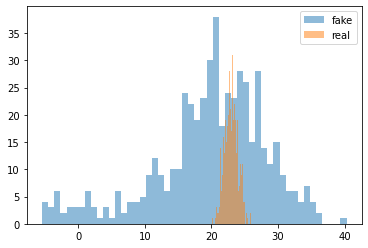

cum_dis_loss 1.2174295783042908, cum_gen_loss 1.194758653640747
386


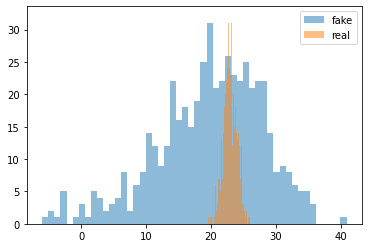

cum_dis_loss 1.1867982029914856, cum_gen_loss 1.1694728136062622
388


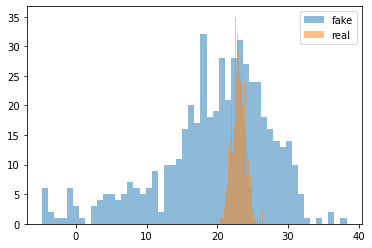

cum_dis_loss 1.1582608103752137, cum_gen_loss 1.151587963104248
390


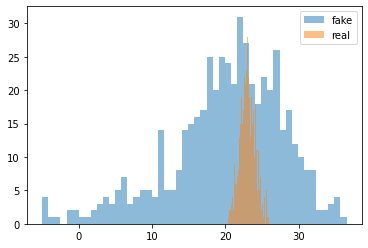

cum_dis_loss 1.1529543995857239, cum_gen_loss 1.1807439923286438
392


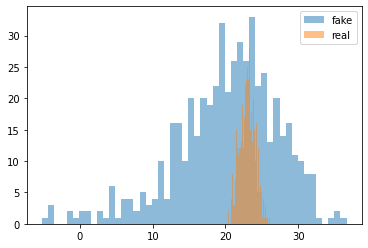

cum_dis_loss 1.1508092403411865, cum_gen_loss 1.123066782951355
394


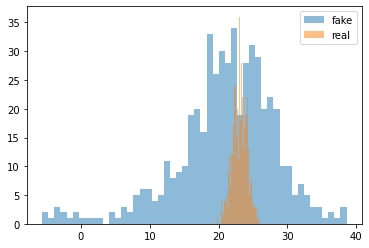

cum_dis_loss 1.1064045548439025, cum_gen_loss 1.136716902256012
396


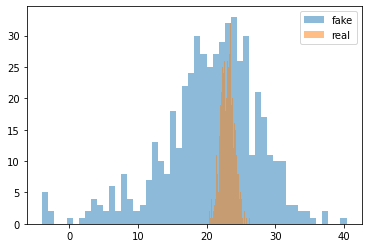

cum_dis_loss 1.1058666825294494, cum_gen_loss 1.1315333247184753
398


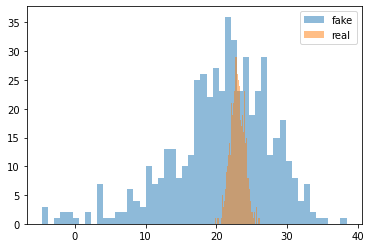

cum_dis_loss 1.0883403897285462, cum_gen_loss 1.092715561389923
400


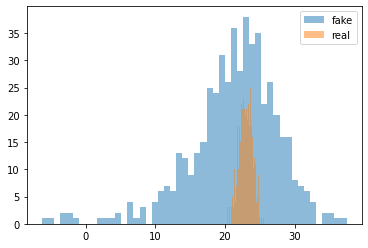

cum_dis_loss 1.0669692873954773, cum_gen_loss 1.065030574798584
402


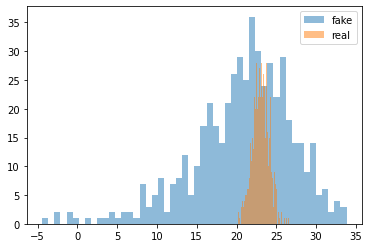

cum_dis_loss 1.0388518154621125, cum_gen_loss 1.070660948753357
404


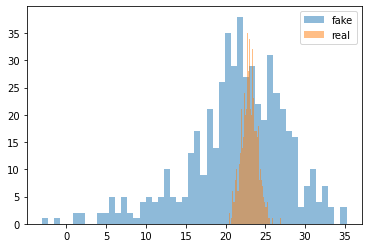

cum_dis_loss 1.049660563468933, cum_gen_loss 0.9926378428936005
406


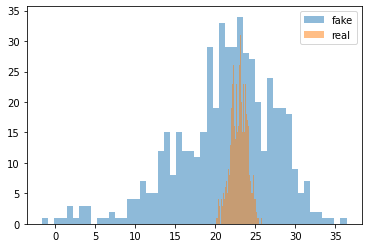

cum_dis_loss 1.0544870316982269, cum_gen_loss 1.0484805703163147
408


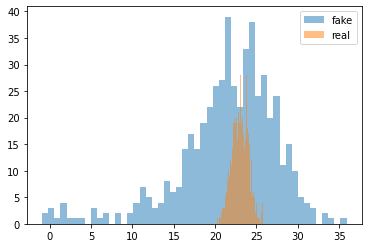

cum_dis_loss 0.9993252575397491, cum_gen_loss 1.0328953862190247
410


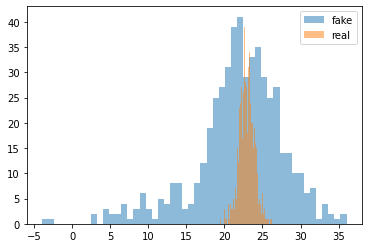

cum_dis_loss 0.9855616927146912, cum_gen_loss 1.0244435667991638
412


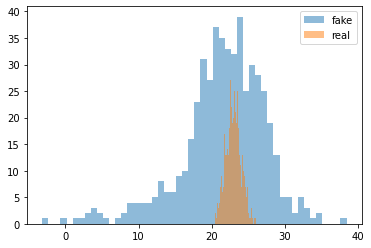

cum_dis_loss 0.9644607782363892, cum_gen_loss 0.9502764940261841
414


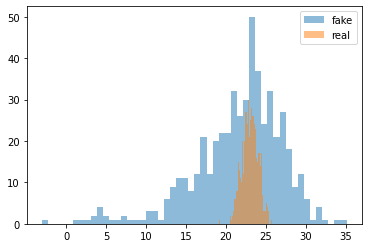

cum_dis_loss 0.9388326346874237, cum_gen_loss 0.918292760848999
416


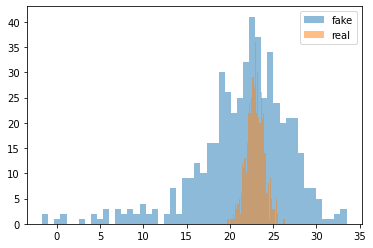

cum_dis_loss 0.8992278337478637, cum_gen_loss 0.9360536932945251
418


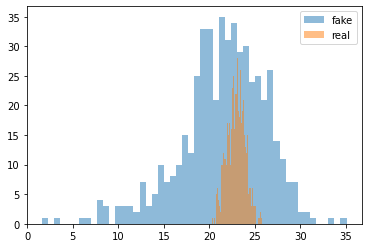

cum_dis_loss 0.8875549018383027, cum_gen_loss 0.8416903018951416
420


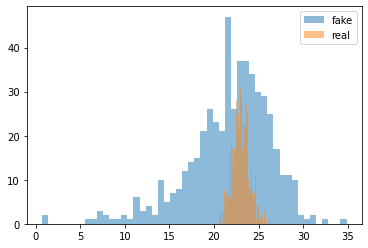

cum_dis_loss 0.8718588352203369, cum_gen_loss 0.8740558624267578
422


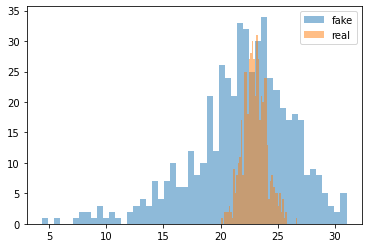

cum_dis_loss 0.8392868220806122, cum_gen_loss 0.8312599956989288
424


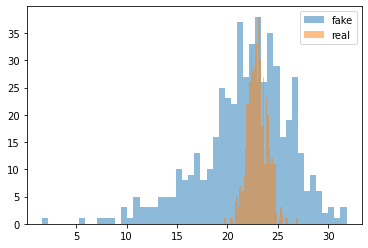

cum_dis_loss 0.7929172873497009, cum_gen_loss 0.7942499816417694
426


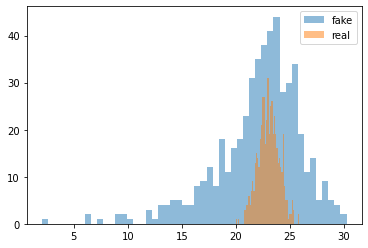

cum_dis_loss 0.7737515032291412, cum_gen_loss 0.77378049492836
428


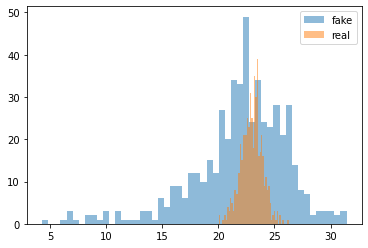

cum_dis_loss 0.7323166072368622, cum_gen_loss 0.7526245713233948
430


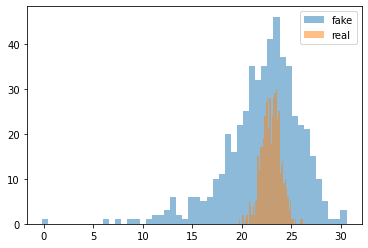

cum_dis_loss 0.6847554028034211, cum_gen_loss 0.659073144197464
432


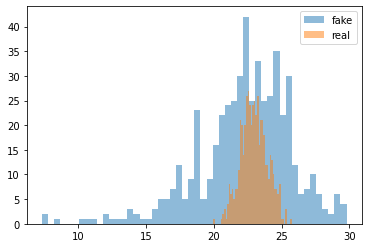

cum_dis_loss 0.64332115650177, cum_gen_loss 0.6255396604537964
434


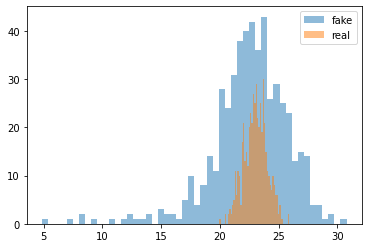

cum_dis_loss 0.6071320831775665, cum_gen_loss 0.5702358186244965
436


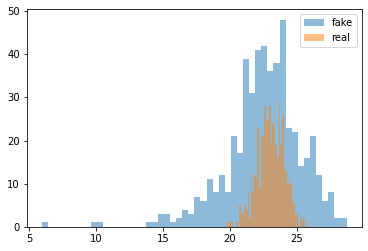

cum_dis_loss 0.5542213439941406, cum_gen_loss 0.5475939512252808
438


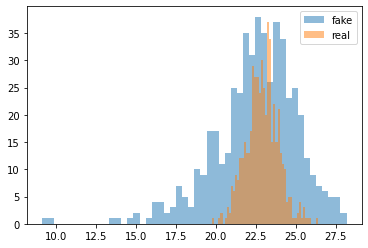

cum_dis_loss 0.4916920840740204, cum_gen_loss 0.5020239353179932
440


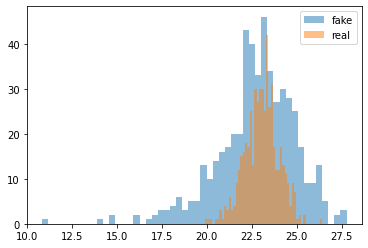

cum_dis_loss 0.4093689024448395, cum_gen_loss 0.40488409996032715
442


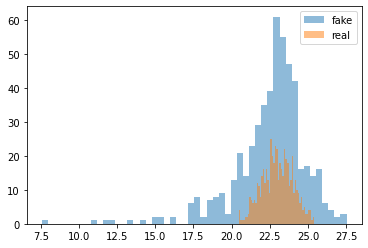

cum_dis_loss 0.3390612632036209, cum_gen_loss 0.3796246647834778
444


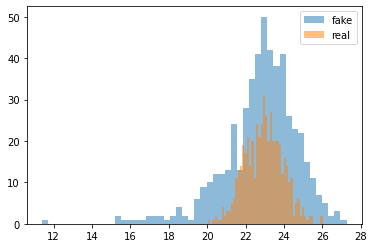

cum_dis_loss 0.25859435051679613, cum_gen_loss 0.30910563468933105
446


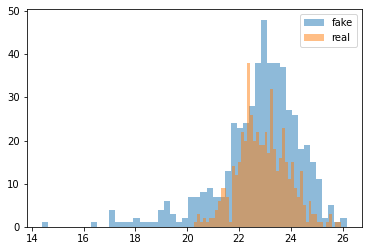

cum_dis_loss 0.18743130266666413, cum_gen_loss 0.1745419278740883
448


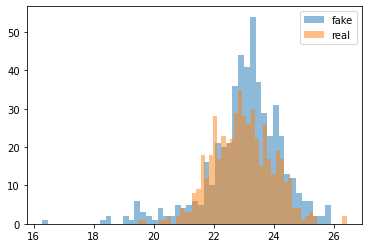

cum_dis_loss 0.1442524254322052, cum_gen_loss 0.11937105655670166
450


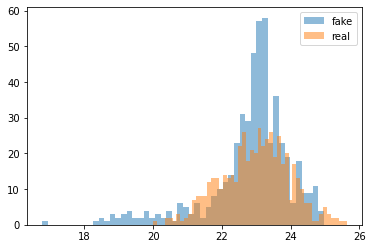

cum_dis_loss 0.13826597929000856, cum_gen_loss 0.12935927882790565
452


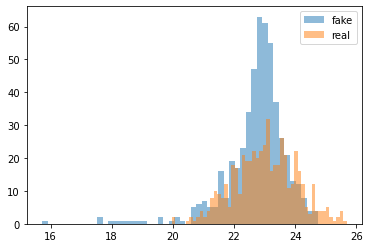

cum_dis_loss 0.17214819192886352, cum_gen_loss 0.15385832637548447
454


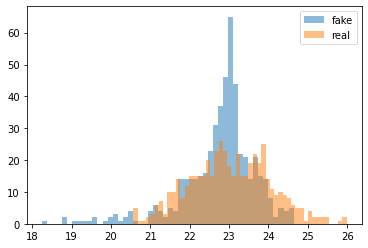

cum_dis_loss 0.1756324663758278, cum_gen_loss 0.17839676141738892
456


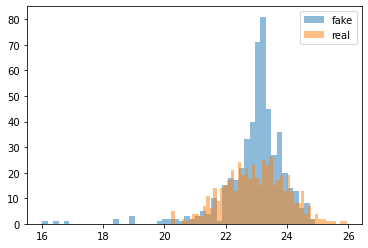

cum_dis_loss 0.15241936817765236, cum_gen_loss 0.1533200889825821
458


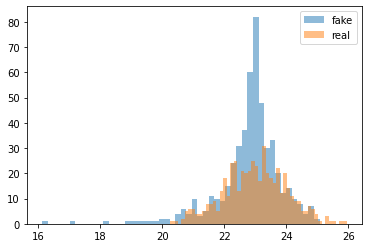

cum_dis_loss 0.17702531367540358, cum_gen_loss 0.13484855741262436
460


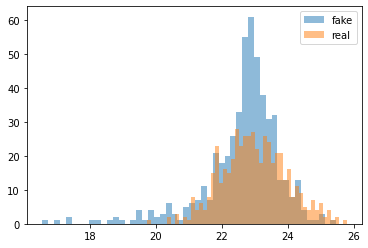

cum_dis_loss 0.1496942989528179, cum_gen_loss 0.14856189489364624
462


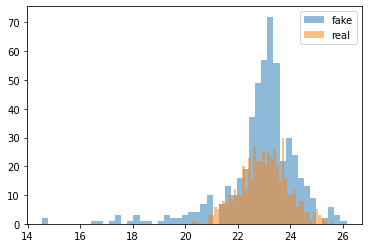

cum_dis_loss 0.15870960876345636, cum_gen_loss 0.16464751213788986
464


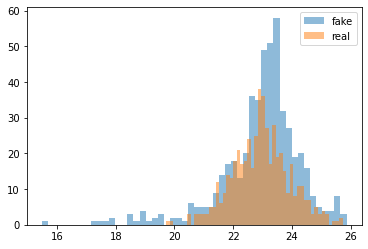

cum_dis_loss 0.16357238665223123, cum_gen_loss 0.13105593994259834
466


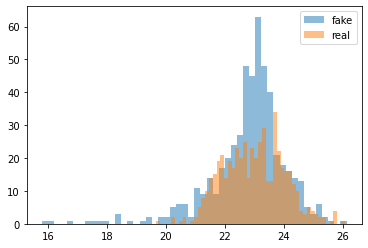

cum_dis_loss 0.12101159244775772, cum_gen_loss 0.13341065496206284
468


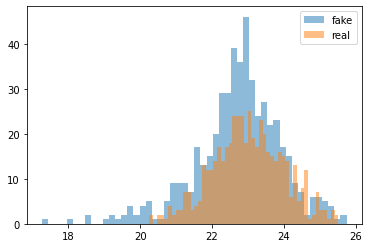

cum_dis_loss 0.10455822460353374, cum_gen_loss 0.10059302672743797
470


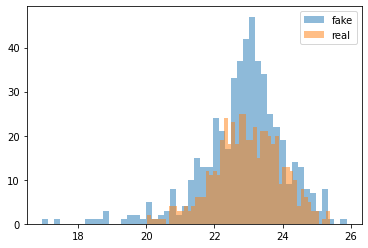

cum_dis_loss 0.09453287161886692, cum_gen_loss 0.0799865871667862
472


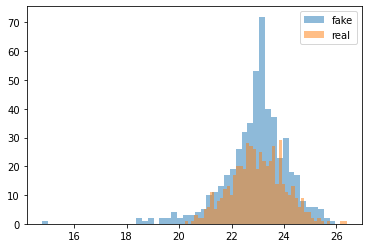

cum_dis_loss 0.0961789421737194, cum_gen_loss 0.09387726336717606
474


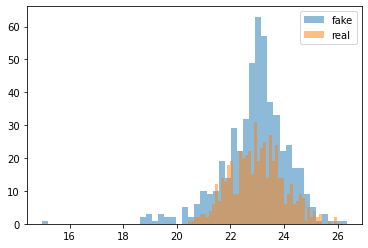

cum_dis_loss 0.08962196446955203, cum_gen_loss 0.08004486933350563
476


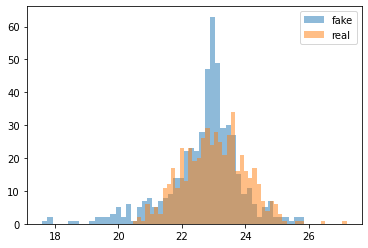

cum_dis_loss 0.10653057768940925, cum_gen_loss 0.10261513665318489
478


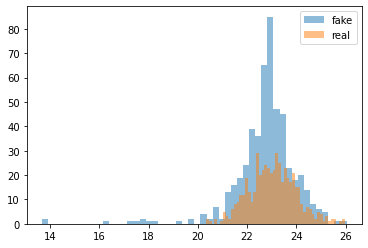

cum_dis_loss 0.10120059624314308, cum_gen_loss 0.10452290251851082
480


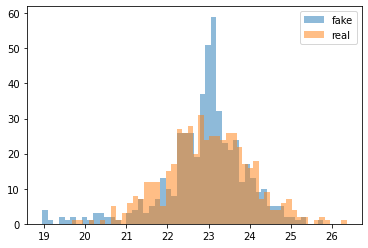

cum_dis_loss 0.10757857337594032, cum_gen_loss 0.09231999516487122
482


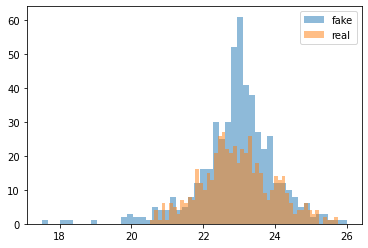

cum_dis_loss 0.08901299461722374, cum_gen_loss 0.10053904727101326
484


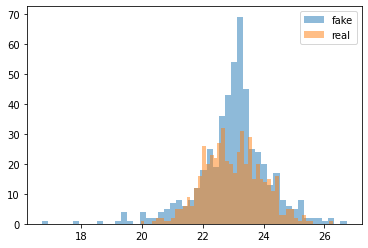

cum_dis_loss 0.11023990362882614, cum_gen_loss 0.11788315325975418
486


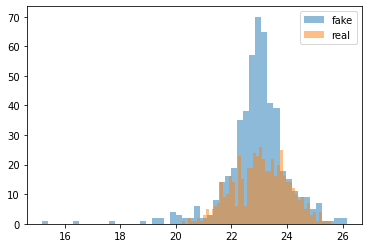

cum_dis_loss 0.10557635091245174, cum_gen_loss 0.11370261758565903
488


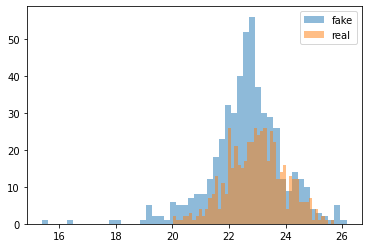

cum_dis_loss 0.12828136831521988, cum_gen_loss 0.11302605271339417
490


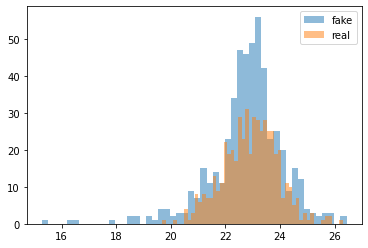

cum_dis_loss 0.11182612292468548, cum_gen_loss 0.10086409375071526
492


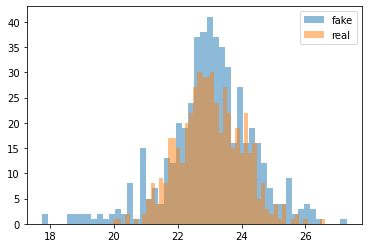

cum_dis_loss 0.11186400726437569, cum_gen_loss 0.09020046889781952
494


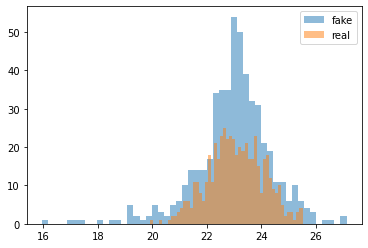

cum_dis_loss 0.09387317672371864, cum_gen_loss 0.08130738511681557
496


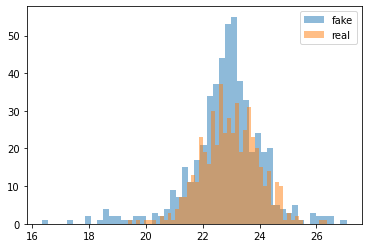

cum_dis_loss 0.10974320992827416, cum_gen_loss 0.09576936811208725
498


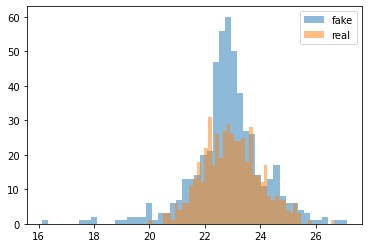

cum_dis_loss 0.09955280721187591, cum_gen_loss 0.07545847818255424
500


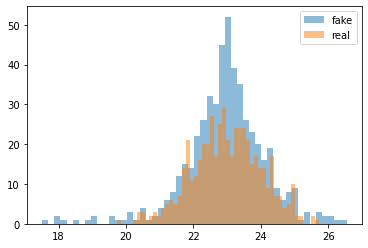

cum_dis_loss 0.07491216100752354, cum_gen_loss 0.09672028198838234
502


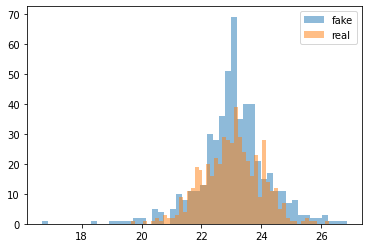

cum_dis_loss 0.08994524329900741, cum_gen_loss 0.08811232820153236
504


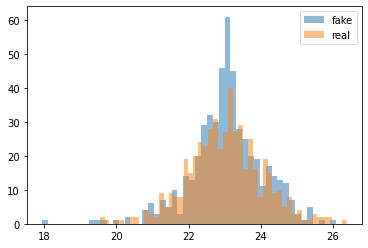

cum_dis_loss 0.08529096394777298, cum_gen_loss 0.09658632054924965
506


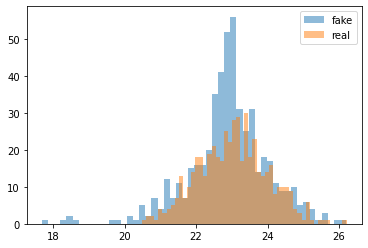

cum_dis_loss 0.08926867991685868, cum_gen_loss 0.08277221396565437
508


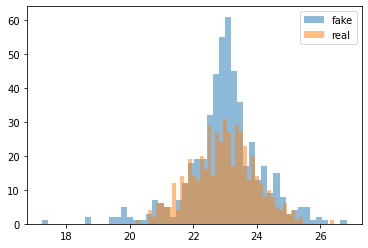

cum_dis_loss 0.08702318146824836, cum_gen_loss 0.12449342012405396
510


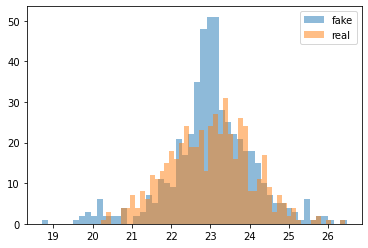

cum_dis_loss 0.0846673771739006, cum_gen_loss 0.0635719746351242
512


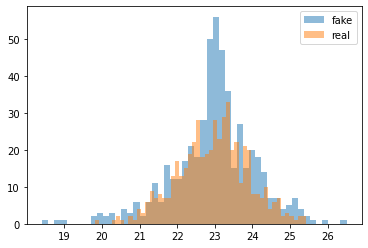

cum_dis_loss 0.09651035591959953, cum_gen_loss 0.08882258087396622
514


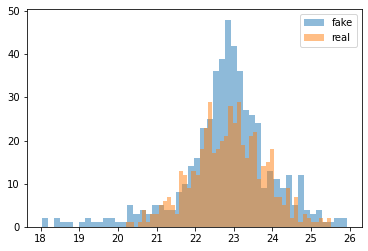

cum_dis_loss 0.08692593313753605, cum_gen_loss 0.09382342919707298
516


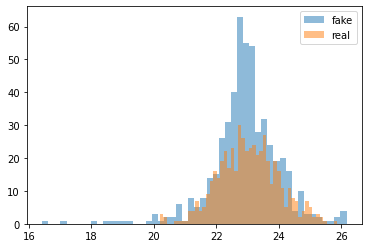

cum_dis_loss 0.08293513990938664, cum_gen_loss 0.11258525773882866
518


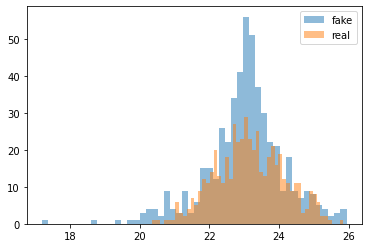

cum_dis_loss 0.1108321875333786, cum_gen_loss 0.10389786586165428
520


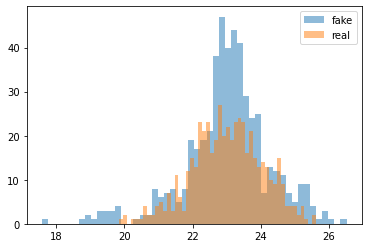

cum_dis_loss 0.11337034702301026, cum_gen_loss 0.12358330190181732
522


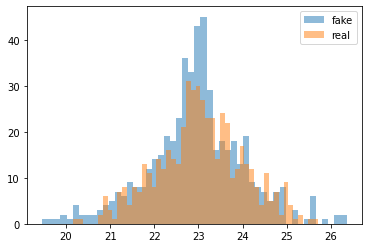

cum_dis_loss 0.09376940503716469, cum_gen_loss 0.0710536390542984
524


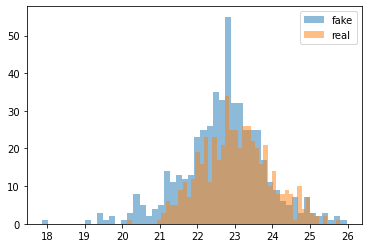

cum_dis_loss 0.15595511198043824, cum_gen_loss 0.18917987495660782
526


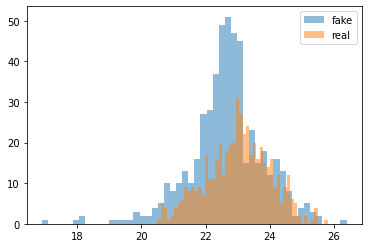

cum_dis_loss 0.1230890229344368, cum_gen_loss 0.13429789617657661
528


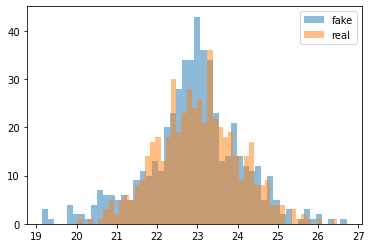

cum_dis_loss 0.08440729342401028, cum_gen_loss 0.09135732427239418
530


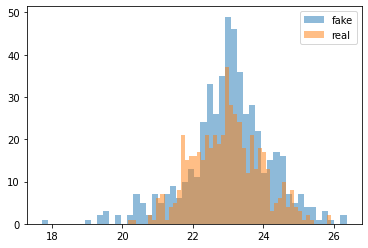

cum_dis_loss 0.07780012004077434, cum_gen_loss 0.08100465685129166
532


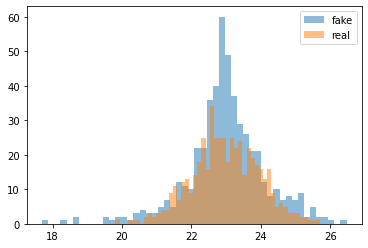

cum_dis_loss 0.070043321326375, cum_gen_loss 0.07786980643868446
534


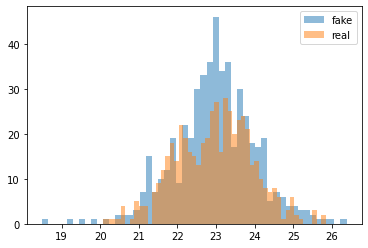

cum_dis_loss 0.08118460513651371, cum_gen_loss 0.09173107519745827
536


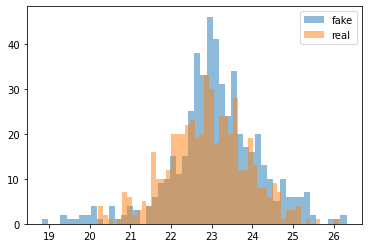

cum_dis_loss 0.09244700707495213, cum_gen_loss 0.10772310942411423
538


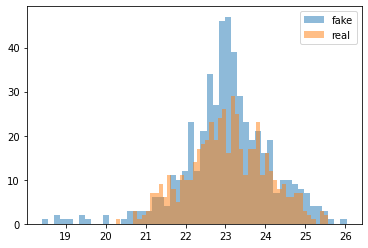

cum_dis_loss 0.0874173577874899, cum_gen_loss 0.09045717865228653
540


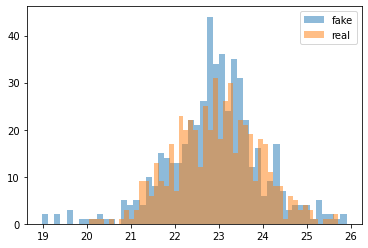

cum_dis_loss 0.08586700037121772, cum_gen_loss 0.10562029108405113
542


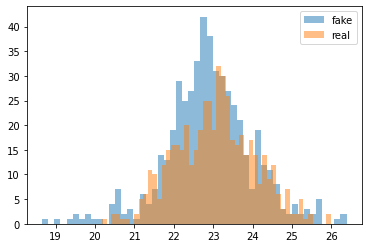

cum_dis_loss 0.12694278359413147, cum_gen_loss 0.09693192690610886
544


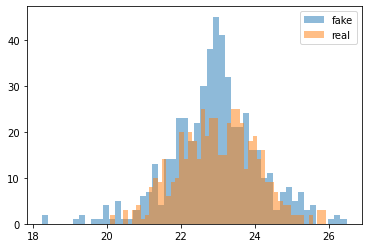

cum_dis_loss 0.08384287878870963, cum_gen_loss 0.0871160663664341
546


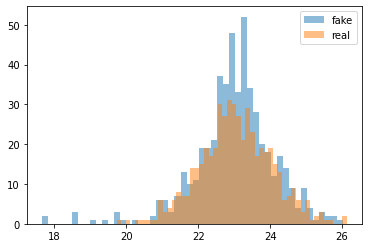

cum_dis_loss 0.1049500696361065, cum_gen_loss 0.11785205826163292
548


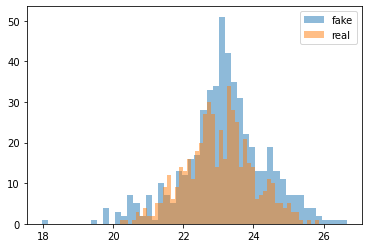

cum_dis_loss 0.11453056558966637, cum_gen_loss 0.12896503880620003
550


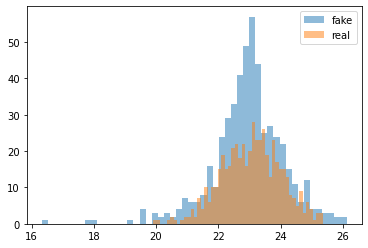

cum_dis_loss 0.07645443007349968, cum_gen_loss 0.10606306046247482
552


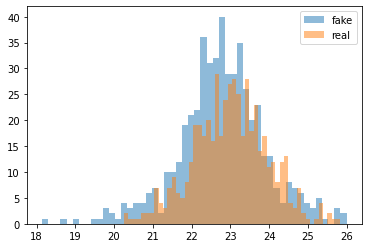

cum_dis_loss 0.11653439849615096, cum_gen_loss 0.14807653427124023
554


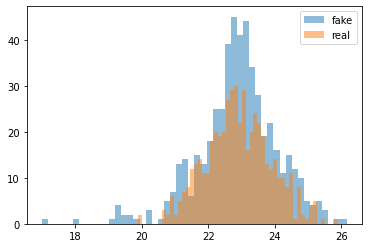

cum_dis_loss 0.09773689024150371, cum_gen_loss 0.12009835243225098
556


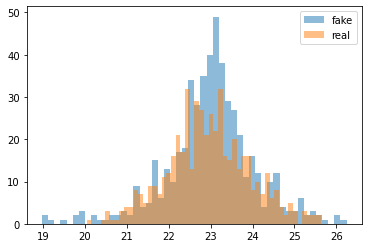

cum_dis_loss 0.1115566372871399, cum_gen_loss 0.12117988616228104
558


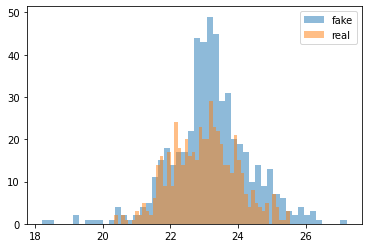

cum_dis_loss 0.17218689918518065, cum_gen_loss 0.15814907848834991
560


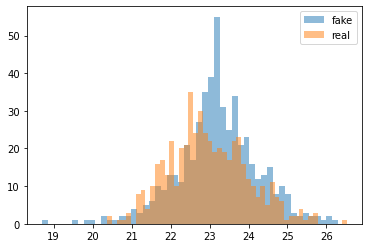

cum_dis_loss 0.14734072163701056, cum_gen_loss 0.15430844575166702
562


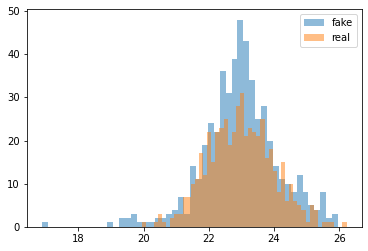

cum_dis_loss 0.09347331970930099, cum_gen_loss 0.062392087653279305
564


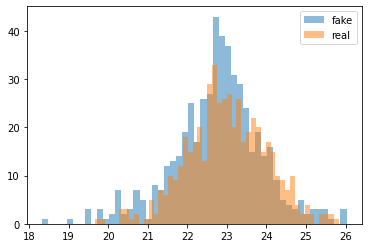

cum_dis_loss 0.14534186385571957, cum_gen_loss 0.13517842814326286
566


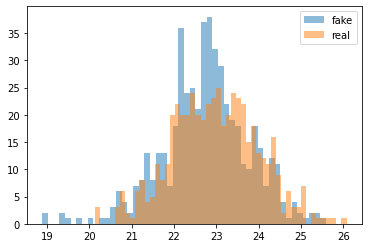

cum_dis_loss 0.15453387945890426, cum_gen_loss 0.16135376691818237
568


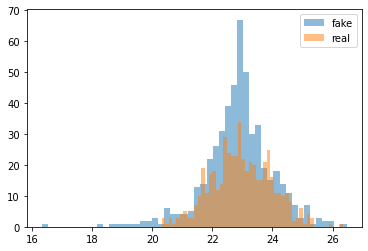

cum_dis_loss 0.07803073562681676, cum_gen_loss 0.1279362179338932
570


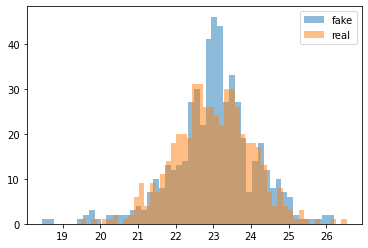

cum_dis_loss 0.12689319327473642, cum_gen_loss 0.1330161765217781
572


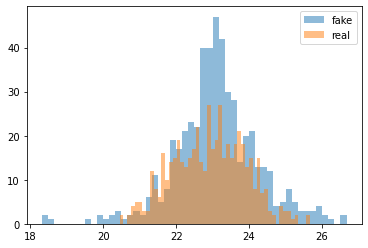

cum_dis_loss 0.10772149711847305, cum_gen_loss 0.08677635341882706
574


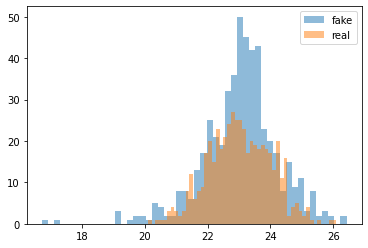

cum_dis_loss 0.11825913414359093, cum_gen_loss 0.08872189745306969
576


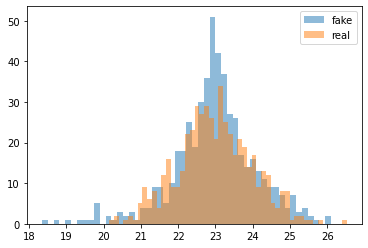

cum_dis_loss 0.06991816759109497, cum_gen_loss 0.055974703282117844
578


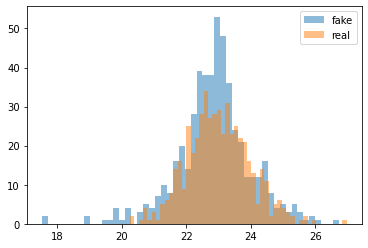

cum_dis_loss 0.07436525598168373, cum_gen_loss 0.09270438924431801
580


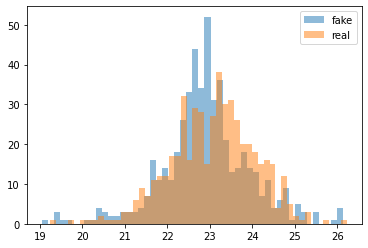

cum_dis_loss 0.09796049371361733, cum_gen_loss 0.07562118768692017
582


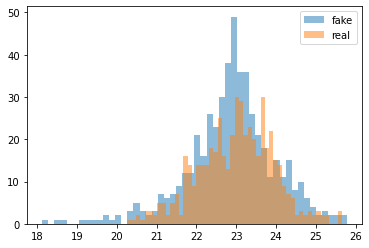

cum_dis_loss 0.08281912915408611, cum_gen_loss 0.06916734762489796
584


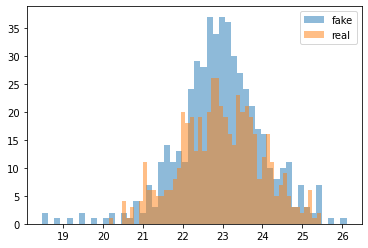

cum_dis_loss 0.07108010947704316, cum_gen_loss 0.0704716295003891
586


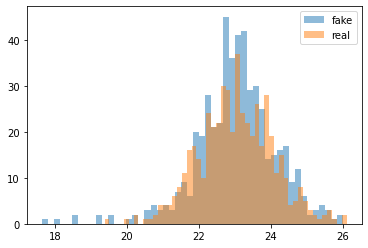

cum_dis_loss 0.07379989996552468, cum_gen_loss 0.0811404436826706
588


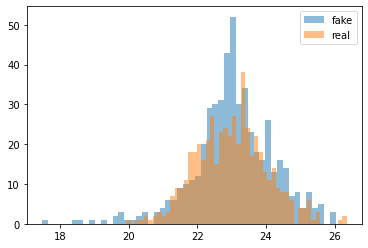

cum_dis_loss 0.07400716356933117, cum_gen_loss 0.10940542444586754
590


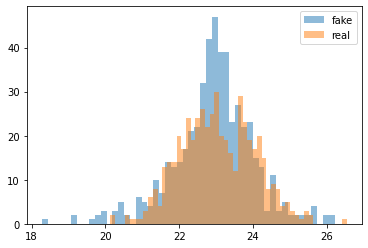

cum_dis_loss 0.08544205203652382, cum_gen_loss 0.0803535059094429
592


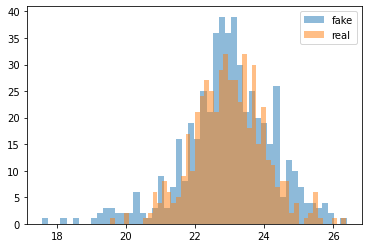

cum_dis_loss 0.07216988839209079, cum_gen_loss 0.09311890974640846
594


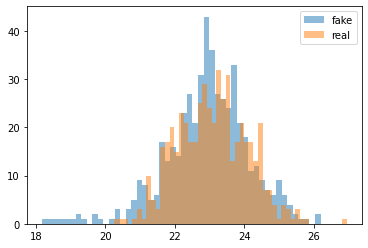

cum_dis_loss 0.07722977809607982, cum_gen_loss 0.08239453285932541
596


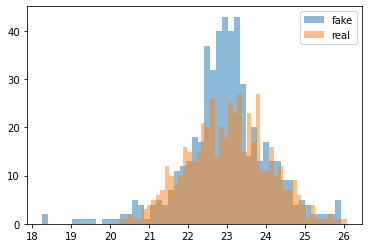

cum_dis_loss 0.07857380472123623, cum_gen_loss 0.09090480580925941
598


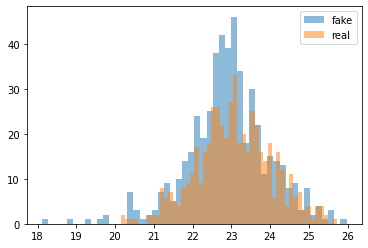

cum_dis_loss 0.11140065267682076, cum_gen_loss 0.07341079041361809
600


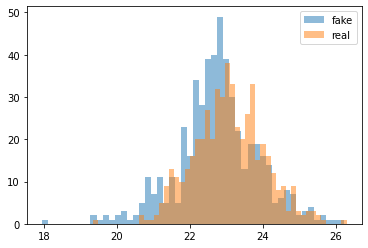

cum_dis_loss 0.12614457681775093, cum_gen_loss 0.09613090753555298
602


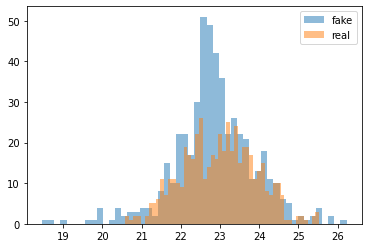

cum_dis_loss 0.07898277305066585, cum_gen_loss 0.10267594456672668
604


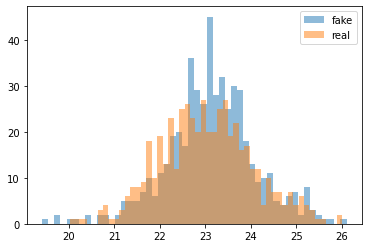

cum_dis_loss 0.09434443302452564, cum_gen_loss 0.09588822349905968
606


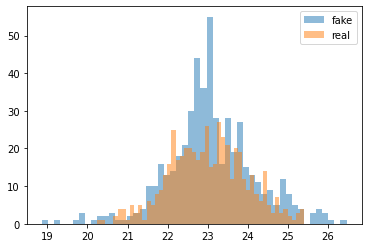

cum_dis_loss 0.0730718806385994, cum_gen_loss 0.10460258647799492
608


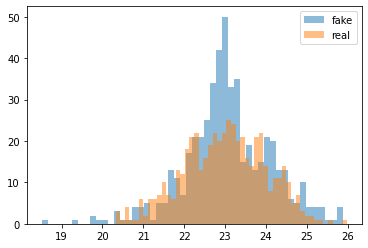

cum_dis_loss 0.07362705394625664, cum_gen_loss 0.0782711822539568
610


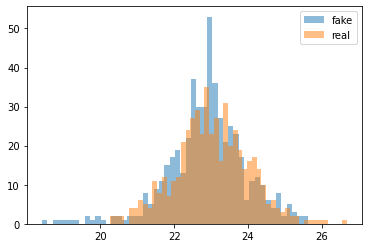

cum_dis_loss 0.07079854793846607, cum_gen_loss 0.08078886941075325
612


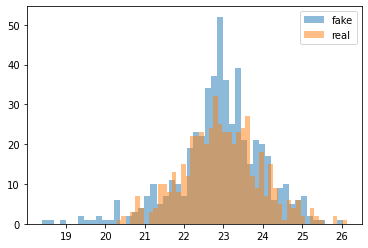

cum_dis_loss 0.07896778509020805, cum_gen_loss 0.07186541333794594
614


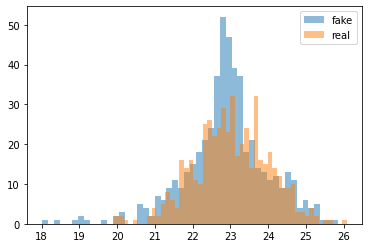

cum_dis_loss 0.08030055388808251, cum_gen_loss 0.05459360405802727
616


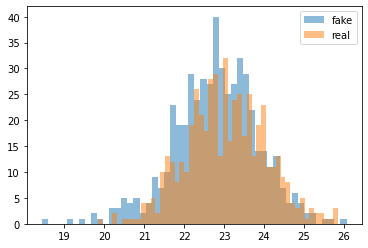

cum_dis_loss 0.10632804930210113, cum_gen_loss 0.06060936488211155
618


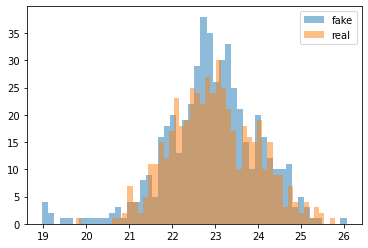

cum_dis_loss 0.09359645061194896, cum_gen_loss 0.10920027270913124
620


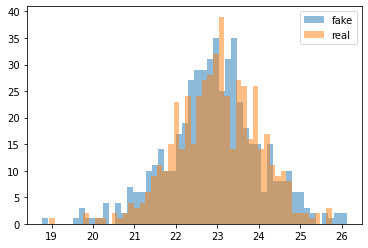

cum_dis_loss 0.07688155509531498, cum_gen_loss 0.09459412470459938
622


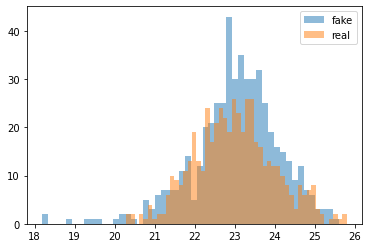

cum_dis_loss 0.08501936830580234, cum_gen_loss 0.079517662525177
624


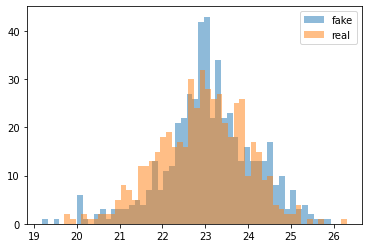

cum_dis_loss 0.11591697335243226, cum_gen_loss 0.08524314314126968
626


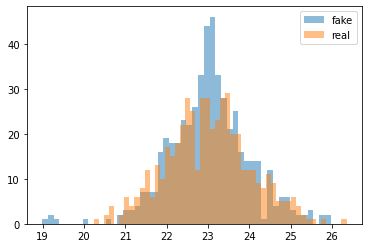

cum_dis_loss 0.06875518709421158, cum_gen_loss 0.07583377696573734
628


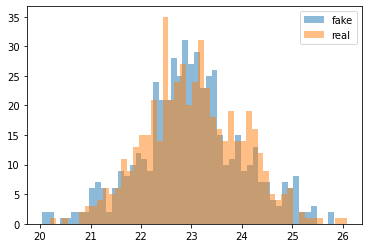

cum_dis_loss 0.08083563297986984, cum_gen_loss 0.0585128553211689
630


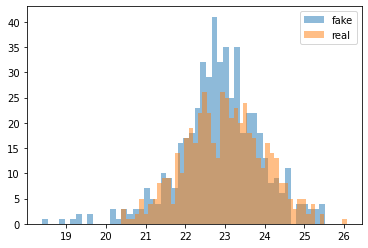

cum_dis_loss 0.1303616262972355, cum_gen_loss 0.1165548712015152
632


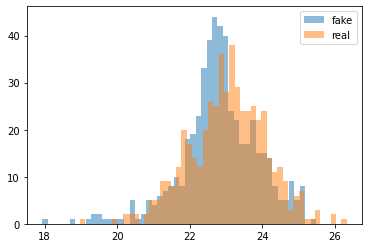

cum_dis_loss 0.07739345356822014, cum_gen_loss 0.07436971738934517
634


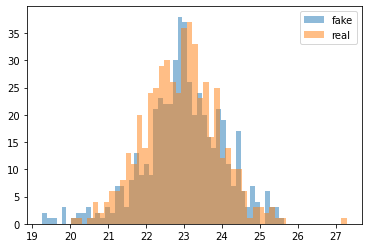

cum_dis_loss 0.10407509319484234, cum_gen_loss 0.08341817930340767
636


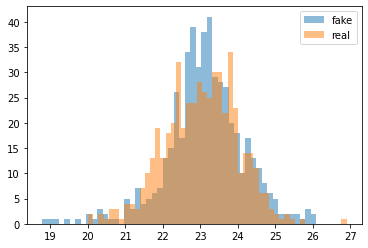

cum_dis_loss 0.09936103411018848, cum_gen_loss 0.0883902758359909
638


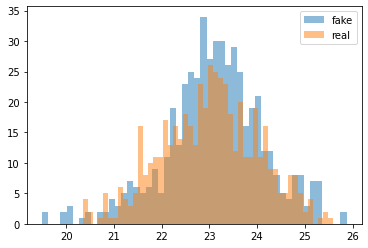

cum_dis_loss 0.09398493263870478, cum_gen_loss 0.14737659320235252
640


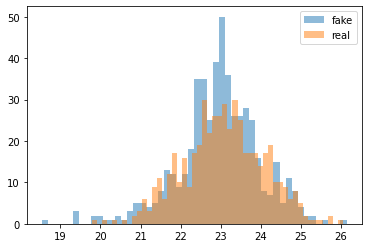

cum_dis_loss 0.06955762822180986, cum_gen_loss 0.08329978585243225
642


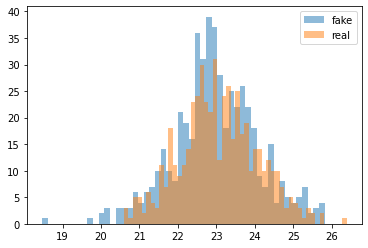

cum_dis_loss 0.08340020440518855, cum_gen_loss 0.11459527909755707
644


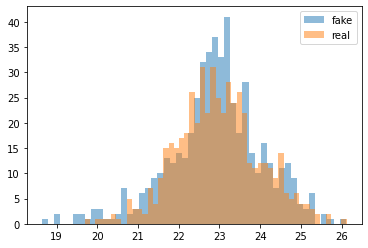

cum_dis_loss 0.06607507765293122, cum_gen_loss 0.06492681428790092
646


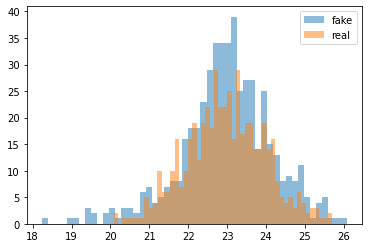

cum_dis_loss 0.07724682614207268, cum_gen_loss 0.08355117216706276
648


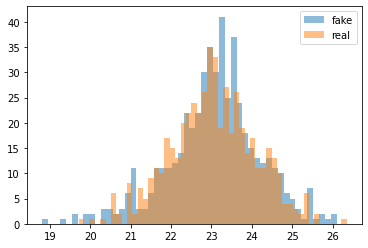

cum_dis_loss 0.12363085895776749, cum_gen_loss 0.11591479927301407
650


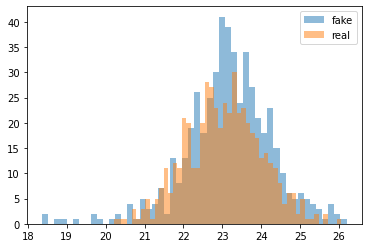

cum_dis_loss 0.09386197850108147, cum_gen_loss 0.07765647396445274
652


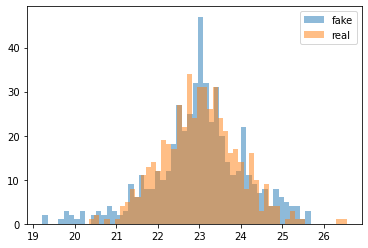

cum_dis_loss 0.07976046353578567, cum_gen_loss 0.05220632068812847
654


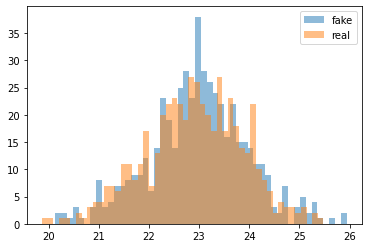

cum_dis_loss 0.07026427909731865, cum_gen_loss 0.11051180213689804
656


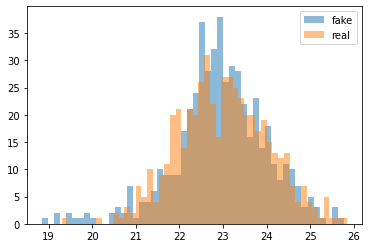

cum_dis_loss 0.06645154803991318, cum_gen_loss 0.09590844437479973
658


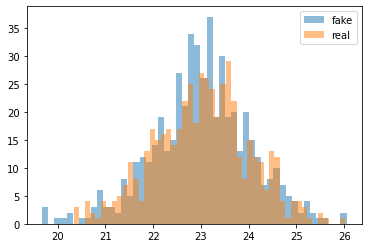

cum_dis_loss 0.08274147808551788, cum_gen_loss 0.12850667163729668
660


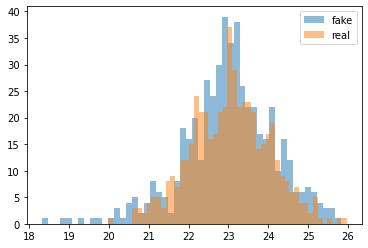

cum_dis_loss 0.0742486946284771, cum_gen_loss 0.08256451040506363
662


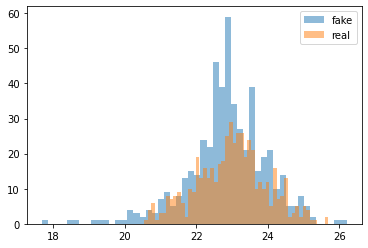

cum_dis_loss 0.07560161799192429, cum_gen_loss 0.08215570449829102
664


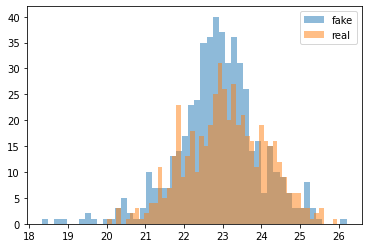

cum_dis_loss 0.07834394797682762, cum_gen_loss 0.06392366252839565
666


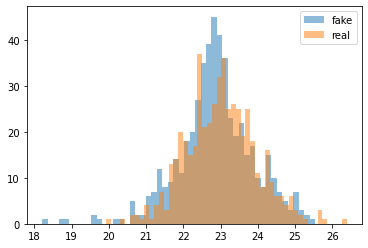

cum_dis_loss 0.08753825798630714, cum_gen_loss 0.12666993215680122
668


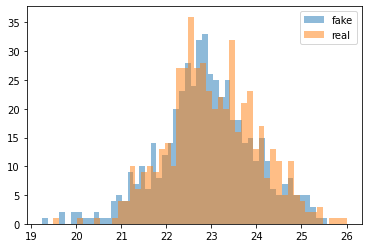

cum_dis_loss 0.07016160748898984, cum_gen_loss 0.08098183199763298
670


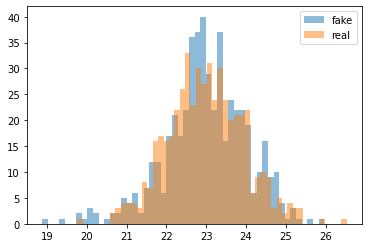

cum_dis_loss 0.08474066816270351, cum_gen_loss 0.06247677095234394
672


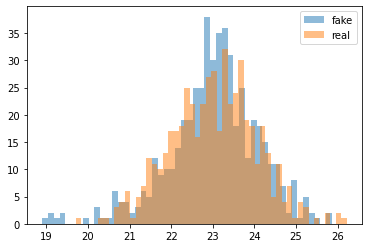

cum_dis_loss 0.08160617463290691, cum_gen_loss 0.07922901771962643
674


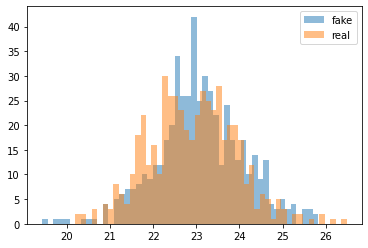

cum_dis_loss 0.08098845966160298, cum_gen_loss 0.09860457852482796
676


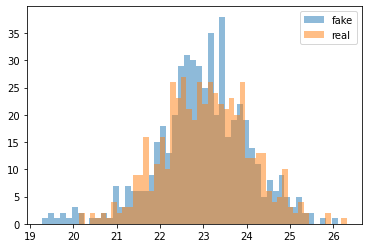

cum_dis_loss 0.06918292976915837, cum_gen_loss 0.06626318395137787
678


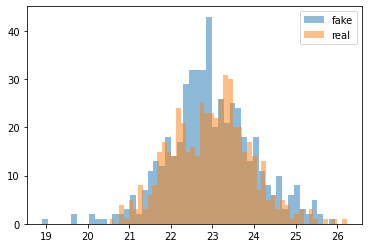

cum_dis_loss 0.10381612814962864, cum_gen_loss 0.1091221272945404
680


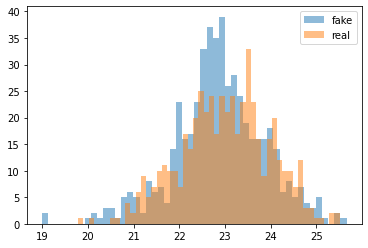

cum_dis_loss 0.08024322129786014, cum_gen_loss 0.1345939300954342
682


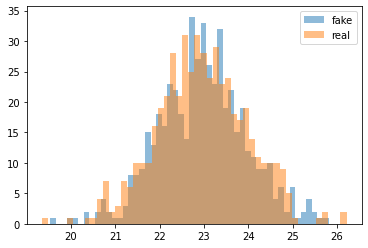

cum_dis_loss 0.07968056574463844, cum_gen_loss 0.06471922248601913
684


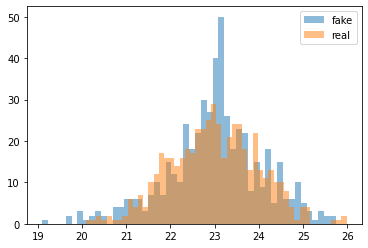

cum_dis_loss 0.08293940089643001, cum_gen_loss 0.08251210302114487
686


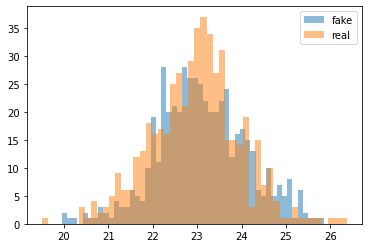

cum_dis_loss 0.07768647260963917, cum_gen_loss 0.09674983657896519
688


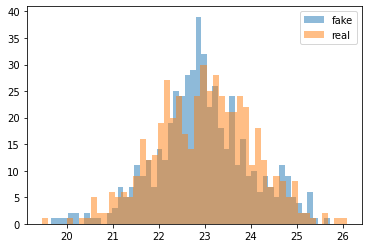

cum_dis_loss 0.06218934338539839, cum_gen_loss 0.060593705624341965
690


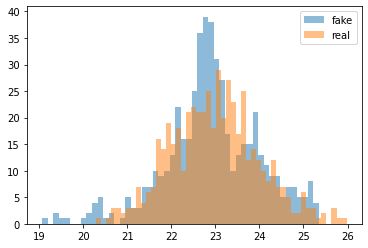

cum_dis_loss 0.08164900541305542, cum_gen_loss 0.0826939232647419
692


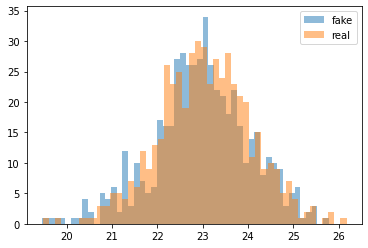

cum_dis_loss 0.0800335070118308, cum_gen_loss 0.10039126127958298
694


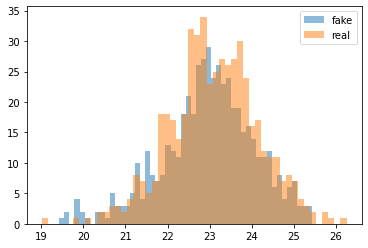

cum_dis_loss 0.0685204241424799, cum_gen_loss 0.06372148729860783
696


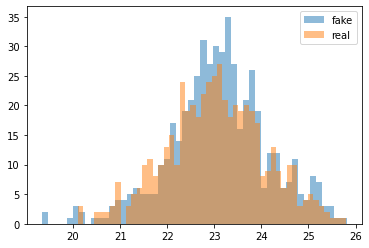

cum_dis_loss 0.08991591110825539, cum_gen_loss 0.090056661516428
698


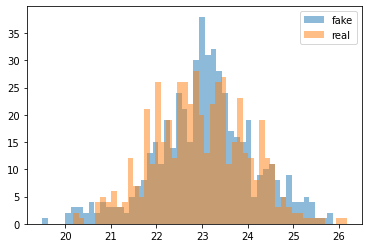

cum_dis_loss 0.11490250416100026, cum_gen_loss 0.14561724662780762
700


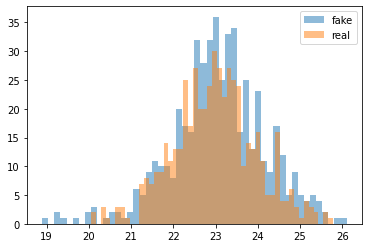

cum_dis_loss 0.08638908304274082, cum_gen_loss 0.1083710789680481
702


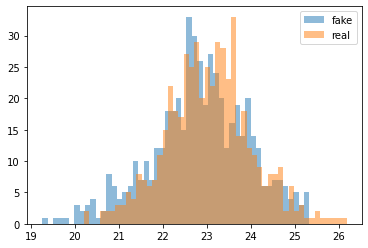

cum_dis_loss 0.08396107852458953, cum_gen_loss 0.07569215074181557
704


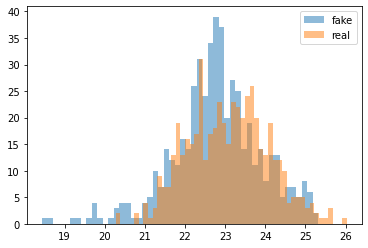

cum_dis_loss 0.12571164816617966, cum_gen_loss 0.1821335181593895
706


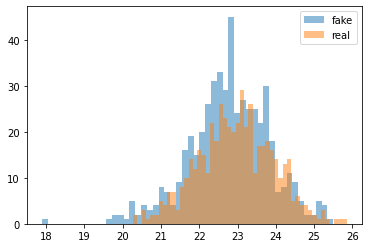

cum_dis_loss 0.09521899707615375, cum_gen_loss 0.12662428244948387
708


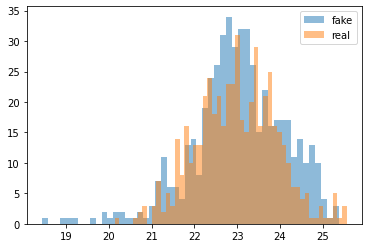

cum_dis_loss 0.06766625903546811, cum_gen_loss 0.05366073548793793
710


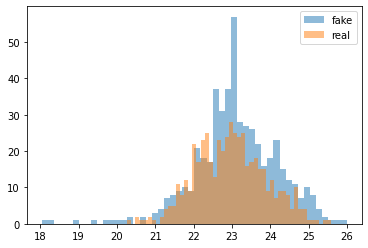

cum_dis_loss 0.0950496569275856, cum_gen_loss 0.09880995377898216
712


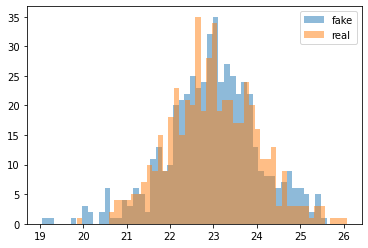

cum_dis_loss 0.08692504651844501, cum_gen_loss 0.04822880029678345
714


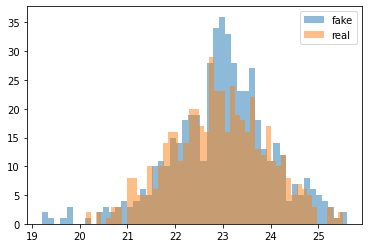

cum_dis_loss 0.05817856136709452, cum_gen_loss 0.07652801275253296
716


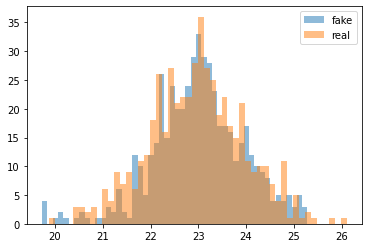

cum_dis_loss 0.07816791385412217, cum_gen_loss 0.07802551798522472
718


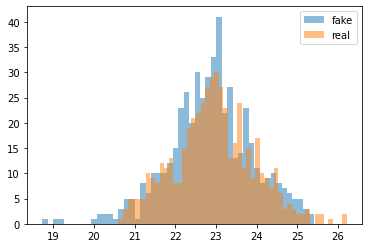

cum_dis_loss 0.08261185772716999, cum_gen_loss 0.09814287722110748
720


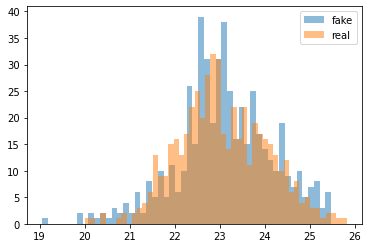

cum_dis_loss 0.07894211038947105, cum_gen_loss 0.05936448089778423
722


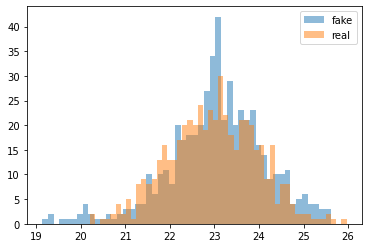

cum_dis_loss 0.08740422651171684, cum_gen_loss 0.07996892184019089
724


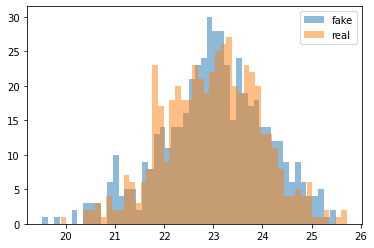

cum_dis_loss 0.06887910924851895, cum_gen_loss 0.04222281463444233
726


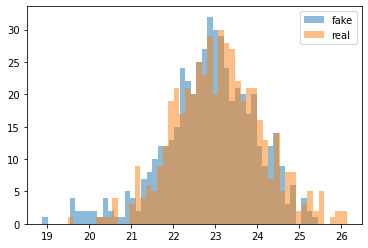

cum_dis_loss 0.07850591801106929, cum_gen_loss 0.05974666029214859
728


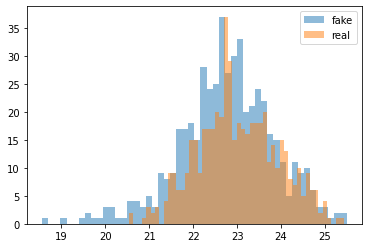

cum_dis_loss 0.0771594826132059, cum_gen_loss 0.054764557629823685
730


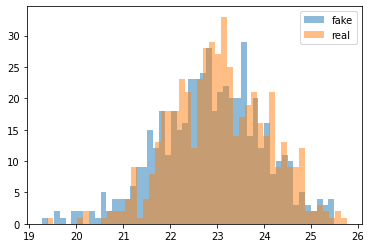

cum_dis_loss 0.07923786006867886, cum_gen_loss 0.07142597250640392
732


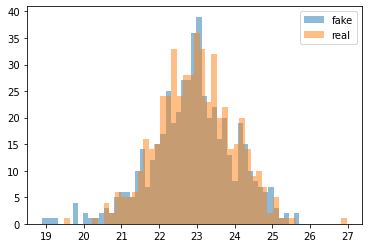

cum_dis_loss 0.07081135511398315, cum_gen_loss 0.11390398070216179
734


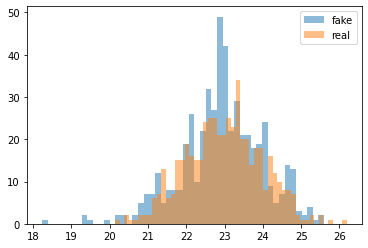

cum_dis_loss 0.05037057250738144, cum_gen_loss 0.04338875599205494
736


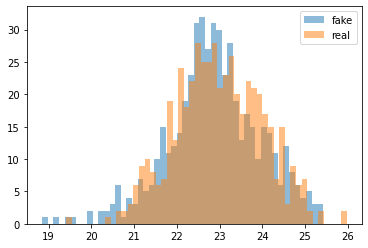

cum_dis_loss 0.07155707851052284, cum_gen_loss 0.08104617893695831
738


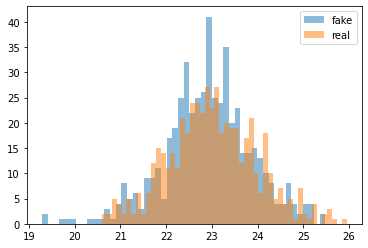

cum_dis_loss 0.07806592173874378, cum_gen_loss 0.0796879455447197
740


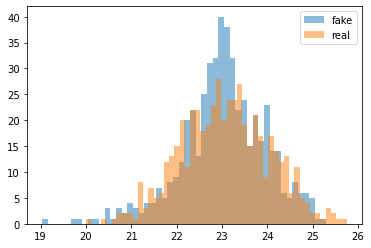

cum_dis_loss 0.09324157498776912, cum_gen_loss 0.055825142189860344
742


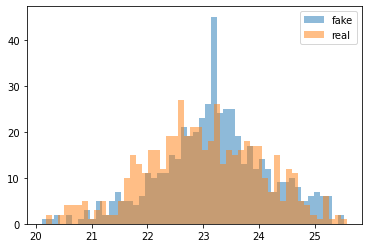

cum_dis_loss 0.11789378896355629, cum_gen_loss 0.1385880522429943
744


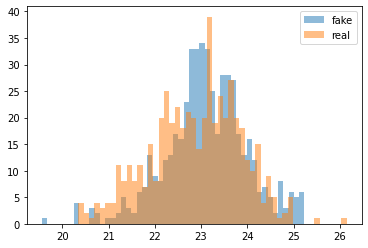

cum_dis_loss 0.1160587266087532, cum_gen_loss 0.12079789116978645
746


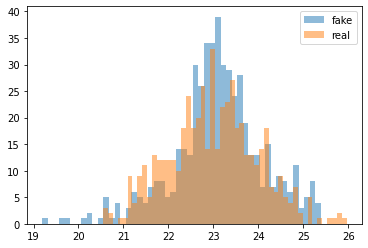

cum_dis_loss 0.0954917635768652, cum_gen_loss 0.05344133824110031
748


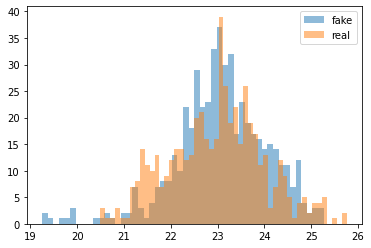

cum_dis_loss 0.06366892568767071, cum_gen_loss 0.06412043422460556
750


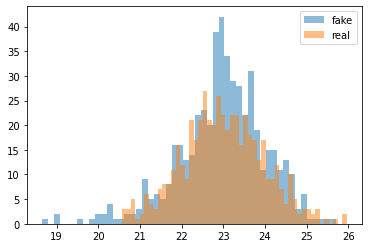

cum_dis_loss 0.07013417817652226, cum_gen_loss 0.07849093899130821
752


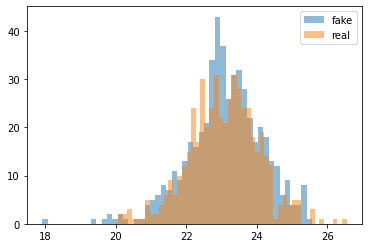

cum_dis_loss 0.0698321633040905, cum_gen_loss 0.0707649402320385
754


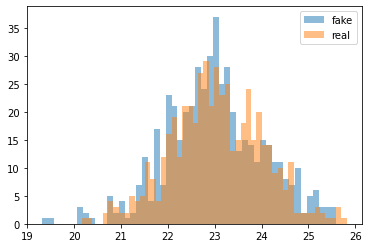

cum_dis_loss 0.07643180564045907, cum_gen_loss 0.07437388226389885
756


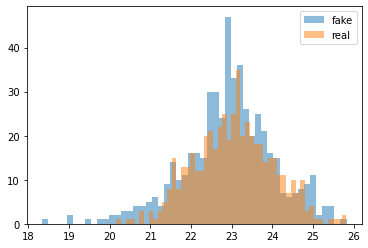

cum_dis_loss 0.07706720121204853, cum_gen_loss 0.07189743593335152
758


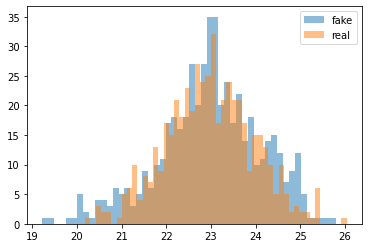

cum_dis_loss 0.08246843069791794, cum_gen_loss 0.05931718461215496
760


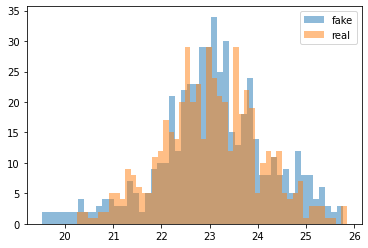

cum_dis_loss 0.07342862561345101, cum_gen_loss 0.12158775702118874
762


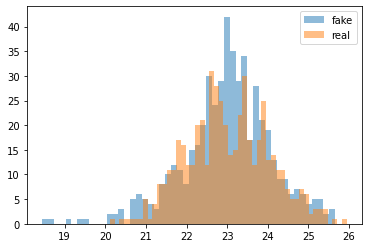

cum_dis_loss 0.07537141013890505, cum_gen_loss 0.045008208602666855
764


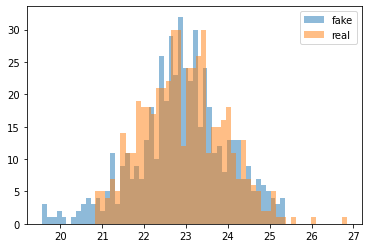

cum_dis_loss 0.06080231685191393, cum_gen_loss 0.05069083161652088
766


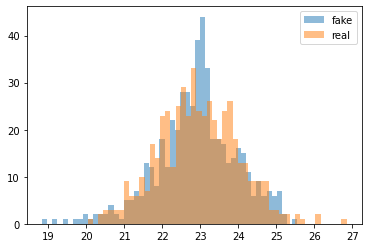

cum_dis_loss 0.06136643514037132, cum_gen_loss 0.10063870996236801
768


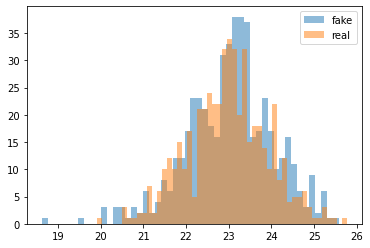

cum_dis_loss 0.08513853214681148, cum_gen_loss 0.04374204482883215
770


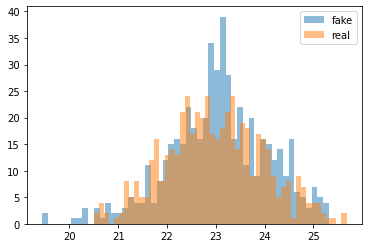

cum_dis_loss 0.07214343547821045, cum_gen_loss 0.12305248528718948
772


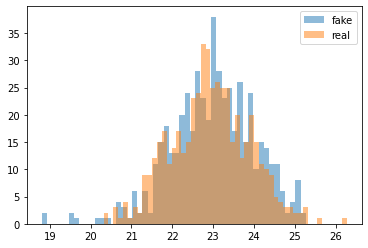

cum_dis_loss 0.06112023815512657, cum_gen_loss 0.07967676594853401
774


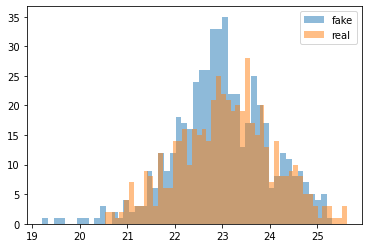

cum_dis_loss 0.07112355418503284, cum_gen_loss 0.062252214178442955
776


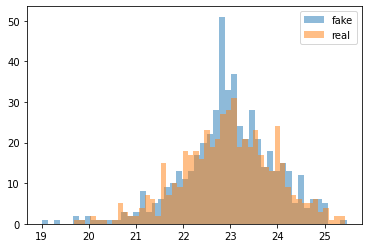

cum_dis_loss 0.07868284881114959, cum_gen_loss 0.05648776516318321
778


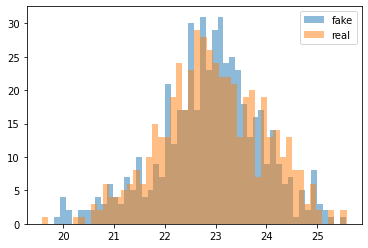

cum_dis_loss 0.06309183109551668, cum_gen_loss 0.055108724161982536
780


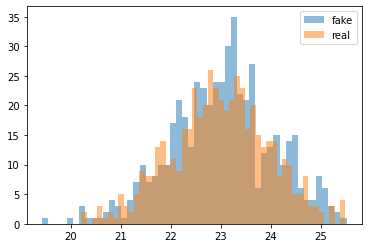

cum_dis_loss 0.04910876490175724, cum_gen_loss 0.06890824995934963
782


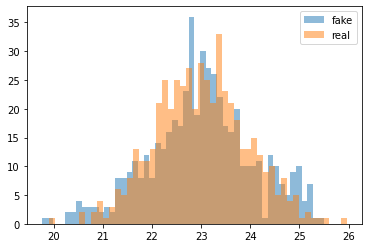

cum_dis_loss 0.06428815498948097, cum_gen_loss 0.07471250370144844
784


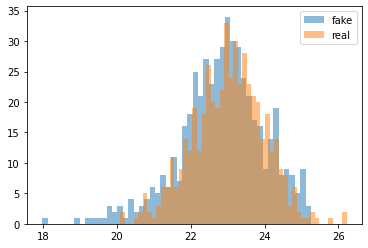

cum_dis_loss 0.07828843481838703, cum_gen_loss 0.0830839779227972
786


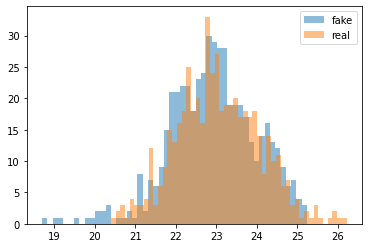

cum_dis_loss 0.09240320287644863, cum_gen_loss 0.06003701966255903
788


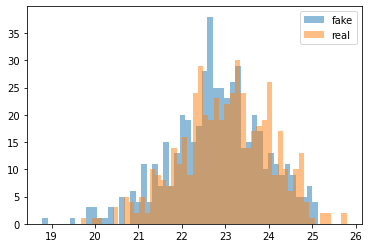

cum_dis_loss 0.10776406563818455, cum_gen_loss 0.09090743958950043
790


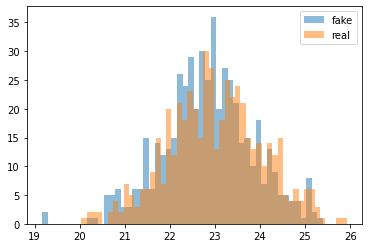

cum_dis_loss 0.0804189171642065, cum_gen_loss 0.09646089747548103
792


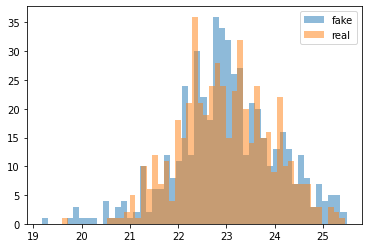

cum_dis_loss 0.07220066003501416, cum_gen_loss 0.0631000492721796
794


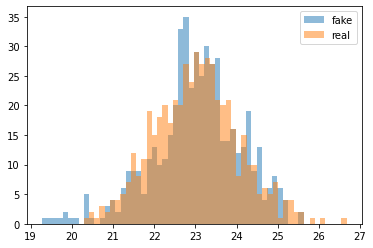

cum_dis_loss 0.08399685360491276, cum_gen_loss 0.08540657162666321
796


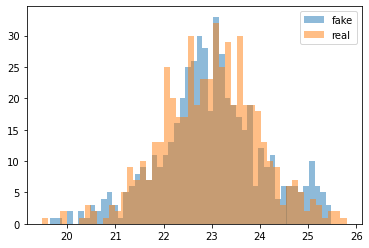

cum_dis_loss 0.08133231103420258, cum_gen_loss 0.061125777661800385
798


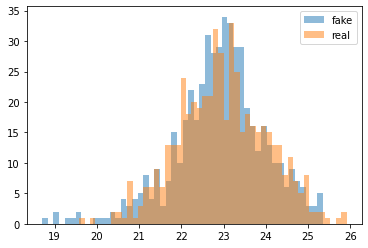

cum_dis_loss 0.06905808858573437, cum_gen_loss 0.06572115048766136
800


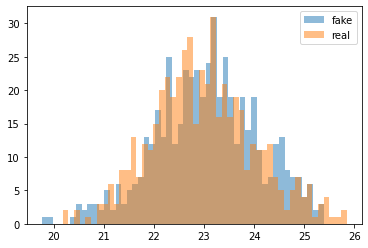

cum_dis_loss 0.06247548200190067, cum_gen_loss 0.06219279021024704
802


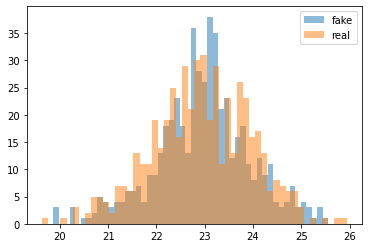

cum_dis_loss 0.10114396288990975, cum_gen_loss 0.07895128428936005
804


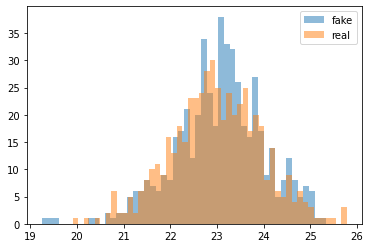

cum_dis_loss 0.08355316370725632, cum_gen_loss 0.09217203035950661
806


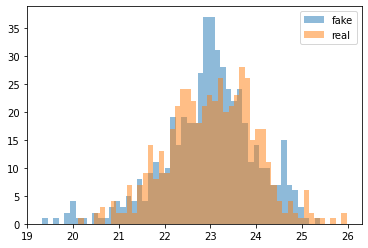

cum_dis_loss 0.07343873716890811, cum_gen_loss 0.0774395540356636
808


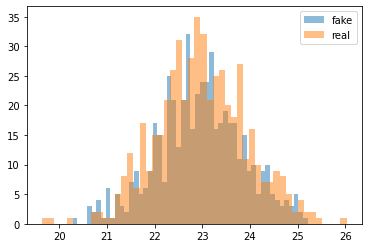

cum_dis_loss 0.0882104303687811, cum_gen_loss 0.08823930472135544
810


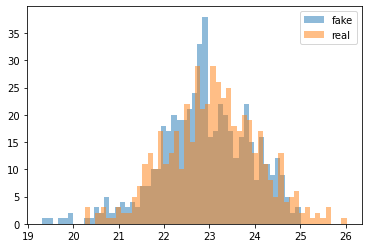

cum_dis_loss 0.1054794941097498, cum_gen_loss 0.08987829834222794
812


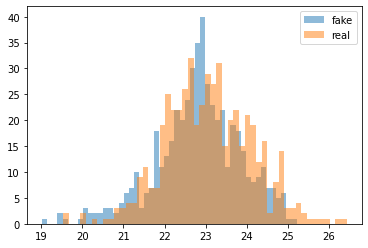

cum_dis_loss 0.0844381295144558, cum_gen_loss 0.09163752943277359
814


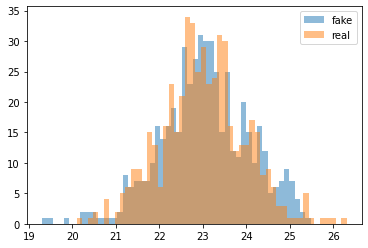

cum_dis_loss 0.05647030472755432, cum_gen_loss 0.08303634822368622
816


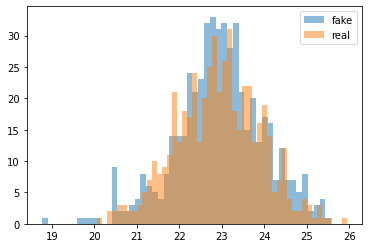

cum_dis_loss 0.07425134256482124, cum_gen_loss 0.048821642994880676
818


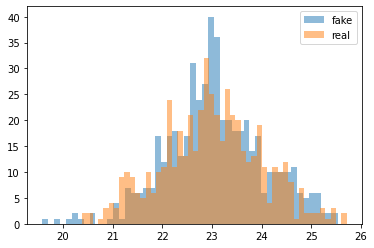

cum_dis_loss 0.05802185982465744, cum_gen_loss 0.05553720332682133
820


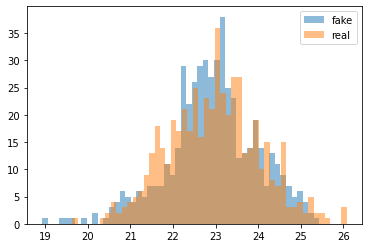

cum_dis_loss 0.05780084319412708, cum_gen_loss 0.06242787092924118
822


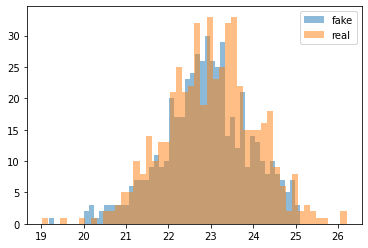

cum_dis_loss 0.07447965070605278, cum_gen_loss 0.08503993973135948
824


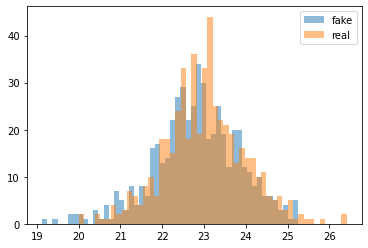

cum_dis_loss 0.0754779752343893, cum_gen_loss 0.06402882561087608
826


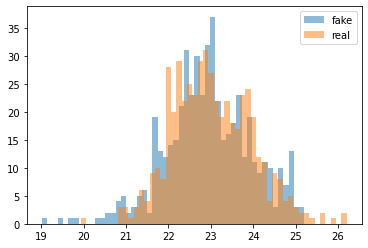

cum_dis_loss 0.061811269447207454, cum_gen_loss 0.058226317167282104
828


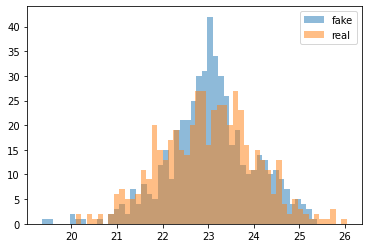

KeyboardInterrupt: 

In [13]:
for iteration in range(num_iteration):
    for i in range(num_enc_dec):
        enc.zero_grad()
        dec.zero_grad()
        target = data_sampler(target_dist, target_param, batch_size)
        noise = data_sampler(noise_dist, noise_param, batch_size)
        encoded_target = enc.forward(target)
        decoded_target = dec.forward(encoded_target)
        L2_AE_target = (target - decoded_target).pow(2).mean()
        transformed_noise = gen.forward(noise)
        encoded_noise = enc.forward(transformed_noise)
        decoded_noise = dec.forward(encoded_noise)
        L2_AE_noise = (transformed_noise - decoded_noise).pow(2).mean()
        MMD = mix_rbf_mmd2(encoded_target, encoded_noise, sigma_list)
        MMD = F.relu(MMD)
        L_MMD_AE = -1 * (torch.sqrt(MMD)-lambda_AE*(L2_AE_noise+L2_AE_target))
        L_MMD_AE.backward()
        enc_optimizer.step()
        dec_optimizer.step()
        cum_dis_loss = cum_dis_loss - L_MMD_AE.item()
    for i in range(num_gen):
        gen.zero_grad()
        target = data_sampler(target_dist, target_param, batch_size)
        noise = data_sampler(noise_dist, noise_param, batch_size)
        encoded_target = enc.forward(target)
        encoded_noise = enc.forward(gen.forward(noise))
        MMD = torch.sqrt(F.relu(mix_rbf_mmd2(encoded_target, encoded_noise, sigma_list)))
        MMD.backward()
        gen_optimizer.step()
        cum_gen_loss = cum_gen_loss + MMD.item()
    if iteration % print_int == 0 and iteration != 0:
        print('cum_dis_loss {}, cum_gen_loss {}'.format(cum_dis_loss/(print_int*num_enc_dec), cum_gen_loss/(print_int*num_gen)))
        cum_dis_loss = 0
        cum_gen_loss = 0
        target = data_sampler(target_dist, target_param, batch_size)
        target = target.data.numpy().reshape(batch_size)
        noise = data_sampler(noise_dist, noise_param, batch_size)
        transformed_noise = gen.forward(noise)
        transformed_noise = transformed_noise.data.numpy().reshape(batch_size)
        print(iteration)
        plt.hist(transformed_noise, 50, label='fake',alpha=0.5)
        
        plt.hist(target,50,label="real",alpha=0.5)
        plt.legend()
        plt.show()

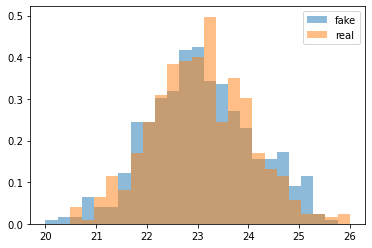

In [45]:
target_dist = "gaussian"
target = data_sampler(target_dist, target_param, batch_size)
target = target.data.numpy().reshape(batch_size)
noise = data_sampler(noise_dist, noise_param, batch_size)
transformed_noise = gen.forward(noise)
transformed_noise = transformed_noise.data.numpy().reshape(batch_size)
plt.hist(transformed_noise, 25,range=(20,26), label='fake',alpha=0.5,density=True)

plt.hist(target,25,range=(20,26),label="real",alpha=0.5,density = True)
plt.legend()

In [49]:
'''
gen = GNet()
enc = Encoder()
dec = Decoder()
'''

'\ngen = GNet()\nenc = Encoder()\ndec = Decoder()\n'

In [51]:
from torchsummary import summary
gen.cuda()

GNet(
  (model): Sequential(
    (0): Linear(in_features=1, out_features=7, bias=True)
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=7, out_features=13, bias=True)
    (3): ELU(alpha=1.0)
    (4): Linear(in_features=13, out_features=7, bias=True)
    (5): ELU(alpha=1.0)
    (6): Linear(in_features=7, out_features=1, bias=True)
  )
)

In [52]:
summary(gen,(batch_size,1))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1               [-1, 512, 7]              14
               ELU-2               [-1, 512, 7]               0
            Linear-3              [-1, 512, 13]             104
               ELU-4              [-1, 512, 13]               0
            Linear-5               [-1, 512, 7]              98
               ELU-6               [-1, 512, 7]               0
            Linear-7               [-1, 512, 1]               8
Total params: 224
Trainable params: 224
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.21
Params size (MB): 0.00
Estimated Total Size (MB): 0.22
----------------------------------------------------------------


In [63]:
dec.cuda()

Decoder(
  (model): Sequential(
    (0): Linear(in_features=29, out_features=11, bias=True)
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=11, out_features=1, bias=True)
  )
)

In [67]:
summary(dec,(29,))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                   [-1, 11]             330
               ELU-2                   [-1, 11]               0
            Linear-3                    [-1, 1]              12
Total params: 342
Trainable params: 342
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.00
----------------------------------------------------------------
